# **Follies and Nonsense, Whims and Inconsistencies: A Pride and Prejudice Socail Network Analysis**

It may be a truth universally acknowledged, that a single man in possession of a good fortune, must be in want of a wife. But that's only the beginning. If you're familiar with the Game of Thrones Social Network Analysis, Network of Thrones, you may wonder what other books would look like boiled down to the interactions between their characters. This analysis sets out to apply a method similar to that used by Beveridge in Network of Thrones to the greatest love stories ever told: Jane Austen's *Pride & Prejudice*, *Emma*, and *Sense & Sensibility*.

The core premis of this analysis it to look at how often two characters in the book interact with each other. In a method similar to Network of Thrones, this analysis will count instances of characters mentioned with proximity to each other, showing their association.

In [ ]:
#Install the required packages.

%pip install nltk

import nltk
nltk.download('punkt')
nltk.download('punkt_tab')
from nltk.tokenize import word_tokenize, sent_tokenize
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import spacy
import requests
from bs4 import BeautifulSoup
from urllib.request import urlopen

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
#set seed

import random

for i in range(2):
    random.seed(0)
    print(random.randint(1, 1000))

865
865


The first step is to load and prepare the data for analysis. In this case, I must create the data set. To prepare it, I first removed the punctuation. There is no need to remove stopwords since we will be tallying character pairings within sentences, so the stop words will be ignored by the analysis. In order to count character interactions, I am going to look within sentences. *Network of Thrones* breaks things up into chunks across sentences, but I did within the already existing sentences.

In [ ]:
#For this project, I used the version of books on Project Guttenberg.

from urllib.request import urlopen

url = 'https://www.gutenberg.org/files/1342/1342-0.txt'

with urlopen(url) as response:
     body = response.read()

# Decode the text
pandp_txt = body.decode('utf-8')

# Replace escaped characters, tabs, and stylized punctuation marks
repl = {'\n':'','\t':'','\ufeff':'', '\r':' ','       ':' ','“':'"','”':'"','’':"'"}
for c in repl:
     pandp_txt = pandp_txt.replace(c, repl[c])

#Tokenizing into sentences.
st_all = sent_tokenize(pandp_txt)
austen_sent = pd.DataFrame(st_all, columns=['Sentence'])
austen_sent.head()

,Sentence
0,*** START OF THE PROJECT GUTENBERG EBOOK 1342 ...
1,and PREJUDICE by Jane Auste...
2,Charing House.
3,Cross Road.
4,London George Allen.


In [ ]:
#Sense & Sensibility
url = 'https://www.gutenberg.org/cache/epub/161/pg161-images.html'

with urlopen(url) as response:
     body = response.read()

# Decode the text
pandp_txt_sense = body.decode('utf-8')

# Replace escaped characters, tabs, and stylized punctuation marks
repl = {'\n':'','\t':'','\ufeff':'', '\r':' ','       ':' ','“':'"','”':'"','’':"'"}
for c in repl:
     pandp_txt_sense = pandp_txt_sense.replace(c, repl[c])

st_all_s = sent_tokenize(pandp_txt_sense)
austen_sent_s = pd.DataFrame(st_all_s, columns=['Sentence'])
austen_sent_s.head()

#austen_sent_s.to_csv('austen_sentences_s.csv', index=True)

,Sentence
0,"<!DOCTYPE html> <html lang=""en""> <head> <meta ..."
1,"""> <link rel=""dcterms.isFormatOf"" href=""http:/..."
2,"You may copy it, give it away or re-use it und..."
3,"If you are not located in the United States, y..."
4,"Their estate was large, and their residence wa..."


In [ ]:
#Emma

url = 'https://www.gutenberg.org/cache/epub/158/pg158-images.html'

with urlopen(url) as response:
     body = response.read()

# Decode the text
pandp_txt_emma = body.decode('utf-8')

# Replace escaped characters, tabs, and stylized punctuation marks
repl = {'\n':'','\t':'','\ufeff':'', '\r':' ','       ':' ','“':'"','”':'"','’':"'"}
for c in repl:
     pandp_txt_emma= pandp_txt_emma.replace(c, repl[c])

st_all_e = sent_tokenize(pandp_txt_emma)
austen_sent_e = pd.DataFrame(st_all_e, columns=['Sentence'])
austen_sent_e.head()

#austen_sent_e.to_csv('austen_sentences_e.csv', index=True)

,Sentence
0,"<!DOCTYPE html> <html lang=""en""><head> <meta c..."
1,"""> <link rel=""dcterms.isFormatOf"" href=""http:/..."
2,"You may copy it, give it away or re-use it und..."
3,"If you are not located in the United States, y..."
4,</p> <p> She was the youngest of the two daug...


These books have a lot of front matter and end matter including an introduction, title page, etc. In this step, I removed the other all non-story components to keep only the story text.

In [ ]:
#cleaning up the text

#Pride & Prejudice
#Removing front matter
#austen_sent = austen_sent[-141:]
austen_sent.drop(index=austen_sent.index[0:142], axis=0, inplace=True)
austen_sent.head()


#sense and sensibility
austen_sent_s.drop(index=austen_sent_s.index[5024:], axis=0, inplace=True)
austen_sent_s.head()

#Removing front matter
austen_sent_s.drop(index=austen_sent_s.index[0:5], axis=0, inplace=True)
austen_sent_s.head()

#Emma
austen_sent_e.drop(index=austen_sent_e.index[7456:], axis=0, inplace=True)
austen_sent_e.head()

#Removing front matter
austen_sent_e.drop(index=austen_sent_e.index[0:5], axis=0, inplace=True)
austen_sent_e.head()

,Sentence
5,Her mother had died too long ago for her to ha...
6,</p> <p> Sixteen years had Miss Taylor been i...
7,Between <i>them</i> it was more the intimacy o...
8,Even before Miss Taylor had ceased to hold the...
9,"</p> <p> The real evils, indeed, of Emma's si..."


Now that the data sets are cleaned up, we can learn a little more about them.

In [ ]:
#Row Counts - Pride & Prejudice
rows = austen_sent.shape[0]
print("Rows: " + str(rows))

#Sense & Sensibility
rows = austen_sent_s.shape[0]
print("Rows: " + str(rows))

#Emma
rows = austen_sent_e.shape[0]
print("Rows: " + str(rows))

#making a CSV of the dataset, just in case.
#austen_sent.to_csv('austen_sentences.csv', index=True)


Rows: 5451
Rows: 5019
Rows: 7451


Pride & Prejudice and Sense & Sensibility are about the same length, 5000 lines. However, Emma is a good bit longer at almost 7500 lines.

With the data tokenized, this next step identifies the characters and puts them into a list so that they can be iterated through. This list will be used later on to match up which characters are interacting or mentioned together in the same sentence.

First, let's get to know the characters in these three novels.

**Pride & Prejudice Characters**

Elizabeth Bennet: the protagonist, also known on occasion as Lizzy

Lizzy is the 2nd of five sisters: Jane, Mary, Kitty, and Lydia. Jane is the oldest, prettiest, and most reflective of the timer period's requirements for women. Kitty and Lydia are somewhat rambunctious and boisterous, with Lydia starting a lot of mischeif. Lizzy's partents, Mr. and Mrs. Bennet are never named.

Lizzy has a best friend named Charlotte, who is a few years older than she is.

**Suitors:**

Fitzwilliam Darcy - man of mystery and few words. Gruff. Quintessential hand flickery.

George Wickham - Son of a friend of Darcy's father. He's suave, in the military, and penniless.

Mr. Collins - a distant cousin of the Bennets who will inherit the Bennet family homestead after Mr. Bennet's death. He's a clergyman (and obnoxious).

Charles Bingley - a friend of Darcy's

**Antagonists:**

Lady Catherine de Bourgh - local noblelady who is Mr. Collins' patron

Caroline Bingley - Mr. Bingley's sister who wants to marry Darcy herself.

**Other Characters:**

Georgiana - Mr. Darcy's younger sister
Mr. & Mrs. Gardiner - relatives of the Bennets

**Sense & Sensibility Characters**

**Dashwoods:**

Henry Dashwood - Dying, penniless father

John Dashwood - elder half-brother and inheritor of the
Dashwood holdings (of which there aren't many)

Mrs. Dashwood - John's step mother and the Dashwood sisters' mother.

Fanny Dashwood - John's wife

Elinor Dashwood - oldest, stoic sister

Marianne Dashwood - middle, boy-crazy sister

Margaret Dashwood - youngest sister

**Extended Family:**

Edward Ferrars - Fanny's brother who has a crush on Elinor

Mrs. Ferrars - Edward and Fanny's mother

Sir John Middleton - Mrs. Dashwood's distant cousin who rents the girls a house for cheap to get them away from Edward Ferrars

Lady Middleton - Sir John's wife

Robert Ferrars - Fanny's brother

**Suitors:**

John Willoughby - Marrianne's love interest

Colonel Brandon - Marrianne's other love interest (who she marries)

**Antagonists:**

Anne & Lucy Steele - calculating sister duo. Lucy may have been secretly engaged to Edward

Miss Sophia Grey - Marries Willoughby after he decides not to marry Marrianne

Other Characters:
Mr. Thomas Palmer & Mrs. Charlotte Palmer - relatives of the Middletons who invite the Dashwoods to visit

Mrs. Jennings - relative of the Middletons

**Emma Characters**

Emma Woodhouse - the protagonist and narrator. Beautiful, poised, and absolutely toxic.

Harriet Smith - Emma's best friend with unknown parentage who lives at boarding school. Does everything Emma says.

**Suitors:**

Mr. George Knightly - Emma's brother in law. Respected landowner.

Frank Churchill - a potential suitor. Determined to be irresponsible, deceitful, among other negative things.

Mr. Elton - village vicar.

**Emma's Family:**

Mr. Woodhouse- Emma's father. Hypochondriac.

Isabella Knightley - Emma's older sister

Mr. John Knightley - Isabella's husband and George's brother

Mr. Robert Martin - tenent of the Knightley's

**Jane Fairfax's orbit:**

Colonel Campbell - Jane's suitor

Mrs. Dixon - Jane's friend
Miss Bates - Jane's aunt. Middleaged spinster who doesn't follow social norms
Mr. Dixon - sends Jane a piano

**Other Characters:**

Mr. & Ms. Weston - Frank's father and step mother. Ms. Weston was also Emma's governess.

Jane Fairfax - Emma's (practically perfect) rival.

Mrs. Augusta Elton (nee Hawkins) - Mr. Elton's wife

Mrs. Churchill - Franks mother and Mr. Weston's former sister in law

Mrs. Goddard - mistress of the boarding school where Harriet lives

Mrs. Bates - Elderly friend of the Woodhouses and mother to Miss Bates

Mr. Perry - apothecary and friend of Mr. Woodhouse
Elizabeth Martin- Mr. Martin's sister and Emma's friend (before she turns down Mr. Mart's proposal)

Mr. & Mrs. Cole- wealthy neighbors of the Woodhouses

John Saunders -opthomologist who lives in town

Mrs. Martin - Robert and Elizabeth's mother


Just like in Network of Thrones, I would like to count all instances where two characters appear in a sentence together, whether mentioned, or because they are interacting.

This is a list of all the characters of interest in each book. Some characters have more than one entry in the list, depending on their name and how different characters address them.

In [ ]:
#Character lists

characters = ['Catherine', 'Kitty', "Mary", "Georgiana", "Mr. Gardiner", "Mrs. Gardiner", "Lady Catherine de Bourgh", "Miss Bingley",
              "Mr. Collins", "George", "Wickham", "Charlotte", "Lydia", "Mr. Bennet", "Mrs. Bennet", "Charles", "Mr. Bingley", "Jane", "Fitzwilliam", "Mr. Darcy", "Elizabeth", "Lizzy"]

characters_s = ['Miss Steele', 'Colonel Brandon', 'Brandon', 'Colonel', 'Mrs. Dashwood', 'Elinor Dashwood', 'Elinor', 'Henry Dashwood', 'Henry', 'Fanny Dashwood', 'Fanny', 'John Dashwood', 'Margaret Dashwood', 'Margaret', 'Marianne Dashwood', 'Marianne', 'Mrs. Ferrars', 'Edward Ferrars', 'Edward', 'Robert Ferrars', 'Robert', 'Miss Sophia Grey', 'Sophia', 'Miss Grey', 'Mrs. Jennings', 'Lady Middleton', 'Sir John Middleton', 'Sir Middleton', 'Sir John', 'Mr. Thomas Palmer', 'Mr. Palmer', 'Thomas', 'Mrs. Charlotte Palmer', 'Mrs. Palmer', 'Charlotte', 'Anne Steele', 'Anne', 'Lucy Steele', 'Lucy', 'John Willoughby', 'Willoughby']

characters_e = ['John Saunders', 'Miss Hawkins', 'Augusta', 'Mrs. Martin', 'George', 'Mr. Knightley', 'George Knightley', 'Mr. Woodhouse', 'Emma', 'Miss Woodhouse', 'Emma Woodhouse', 'Harriet', 'Miss Smith', 'Harriet Smith',  'Frank Churchill', 'Frank', 'Mr. Churchill', 'Jane Fairfax', 'Jane', 'Miss Fairfax', 'Ms. Weston', 'Mr. Weston', 'Mr. Elton', 'Mr. Robert Martin', 'Robert', 'Mr. Martin', 'Miss Bates', 'Isabella Knightley', "Mrs. John Knightley", 'Mrs. Knightley', 'Isabella' 'Mr. John Knightley', 'Mrs. Elton', 'Mrs. Churchill', 'Colonel Campbell', 'Mr. Dixon', 'Mrs. Goddard', 'Mrs. Bates', 'Mr. Perry', 'Elizabeth Martin', 'Mr. Cole', 'Mrs. Cole']

I need a function that will iterate over the tokenized sentences as well as the list of characters, identify instances where two characters appear in the same sentence together (order-independent), and then tally it.

This results in a data frame where every character in the list created earlier is paired exactly one time with every other character in the list, and how many times each pair appears in a sentence together. The immediate, glaring red flag with this issue is that some characters are known by multiple names; first, last, nick-names. Some characters have a title in their name that could result in miscounts. I will address this later through some manual reconciliation.

Full disclosure: I asked Gemini to help me with these steps.

In [ ]:
#The iterative setnence

import itertools

def count_character_co_occurrence(sentence_list, character_list):
    """
    Counts the co-occurrence of each unique pair of characters within sentences.

    Args:
      sentence_list: A list of tokenized sentences (list of lists of words).
      character_list: A list of characters to check for co-occurrence.

    Returns:
      A pandas DataFrame with character pairs and their co-occurrence counts.
    """
    # Create a list of all unique character pairs
    character_pairs = list(itertools.combinations(character_list, 2))

    # Prepare a list to store the results
    results_list = []

    # Iterate through each character pair and calculate co-occurrence
    for char1, char2 in character_pairs:
        co_occurrence_count = 0
        # Iterate through each sentence
        for sentence in sentence_list:
            # Check if both characters are in the current sentence
            if char1 in sentence and char2 in sentence:
                co_occurrence_count += 1
        results_list.append({'Character 1': char1, 'Character 2': char2, 'Co-occurrence Count': co_occurrence_count})

    # Create the co-occurrence DataFrame
    co_occurrence_df = pd.DataFrame(results_list)

    return co_occurrence_df

Now we apply the function to the list of characters and the tokenized sentences in *Pride & Prejudice*, *Sense & Sensibility*, and *Emma*. The results are formatted as an edgelist that will be used later to create social network visualizations.

In [ ]:
#Applying the function - Pride & Prejudice

character_co_occurrence_df = count_character_co_occurrence(austen_sent['Sentence'], characters)
display(character_co_occurrence_df)

#Applying the function - Sense & Sensibility

character_co_occurrence_df_s = count_character_co_occurrence(austen_sent_s['Sentence'], characters_s)
display(character_co_occurrence_df_s)

#Applying the function - Emma

character_co_occurrence_df_e = count_character_co_occurrence(austen_sent_e['Sentence'], characters_e)
display(character_co_occurrence_df_e)

,Character 1,Character 2,Co-occurrence Count
0,Catherine,Kitty,1
1,Catherine,Mary,1
2,Catherine,Georgiana,0
3,Catherine,Mr. Gardiner,0
4,Catherine,Mrs. Gardiner,0
...,...,...,...
226,Fitzwilliam,Elizabeth,7
227,Fitzwilliam,Lizzy,0
228,Mr. Darcy,Elizabeth,49
229,Mr. Darcy,Lizzy,2


,Character 1,Character 2,Co-occurrence Count
0,Miss Steele,Colonel Brandon,1
1,Miss Steele,Brandon,1
2,Miss Steele,Colonel,1
3,Miss Steele,Mrs. Dashwood,0
4,Miss Steele,Elinor Dashwood,0
...,...,...,...
815,Lucy Steele,John Willoughby,0
816,Lucy Steele,Willoughby,0
817,Lucy,John Willoughby,0
818,Lucy,Willoughby,1


,Character 1,Character 2,Co-occurrence Count
0,John Saunders,Miss Hawkins,0
1,John Saunders,Augusta,0
2,John Saunders,Mrs. Martin,0
3,John Saunders,George,0
4,John Saunders,Mr. Knightley,0
...,...,...,...
815,Mr. Perry,Mr. Cole,0
816,Mr. Perry,Mrs. Cole,0
817,Elizabeth Martin,Mr. Cole,0
818,Elizabeth Martin,Mrs. Cole,0


As mentioned previously, it's easy to see in the preview how Mr. Darcy appears also as Fitzwilliam, and how Lizzy and Elizabeth are also being counted separately.

This is unavoidable based on how the list of characters was set up. Thus, I need to do some manual reconciliation. In the next step, I rename some of the characters so that they are only counted once.

In [ ]:
#This step combines redundant pairings to avoid situations where a character is counted as interacting with themself.

# Combine Redundant rows
character_co_occurrence_df['Character 1'] = character_co_occurrence_df['Character 1'].replace('Lizzy', 'Elizabeth')
character_co_occurrence_df['Character 2'] = character_co_occurrence_df['Character 2'].replace('Lizzy', 'Elizabeth')

character_co_occurrence_df['Character 1'] = character_co_occurrence_df['Character 1'].replace('George', 'Wickham')
character_co_occurrence_df['Character 2'] = character_co_occurrence_df['Character 2'].replace('George', 'Wickham')

character_co_occurrence_df['Character 1'] = character_co_occurrence_df['Character 1'].replace('Fitzwilliam', 'Mr. Darcy')
character_co_occurrence_df['Character 2'] = character_co_occurrence_df['Character 2'].replace('Fitzwilliam', 'Mr. Darcy')

character_co_occurrence_df['Character 1'] = character_co_occurrence_df['Character 1'].replace('Catherine', 'Lady Catherine de Bourgh')
character_co_occurrence_df['Character 2'] = character_co_occurrence_df['Character 2'].replace('Catherine', 'Lady Catherine de Bourgh')

character_co_occurrence_df['Character 1'] = character_co_occurrence_df['Character 1'].replace('Charles', 'Mr. Bingley')
character_co_occurrence_df['Character 2'] = character_co_occurrence_df['Character 2'].replace('Charles', 'Mr. Bingley')


# Group by the combined characters and sum the co-occurrence counts
character_co_occurrence_df = character_co_occurrence_df.groupby(['Character 1', 'Character 2'], as_index=False)['Co-occurrence Count'].sum()

# Filter out rows where Character 1 and Character 2 are the same after combining
character_co_occurrence_df = character_co_occurrence_df[character_co_occurrence_df['Character 1'] != character_co_occurrence_df['Character 2']]

# Filter for co-occurrence counts >= 1 again after aggregation
character_co_occurrence_df = character_co_occurrence_df[character_co_occurrence_df['Co-occurrence Count'] >= 1]

character_co_occurrence_df

,Character 1,Character 2,Co-occurrence Count
0,Charlotte,Elizabeth,25
1,Charlotte,Jane,7
2,Charlotte,Lydia,1
3,Charlotte,Mr. Bennet,2
4,Charlotte,Mr. Bingley,1
...,...,...,...
140,Wickham,Lydia,25
141,Wickham,Mr. Bennet,4
142,Wickham,Mr. Bingley,4
143,Wickham,Mr. Darcy,24


In [ ]:
#This step combines redundant pairings to avoid situations where a character is counted as interacting with themself.

# Combine Redundant rows
character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Anne', 'Anne Steele')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Anne', 'Anne Steele')
character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Miss Steele', 'Anne Steele')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Miss Steele', 'Anne Steele')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Lucy', 'Lucy Steele')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Lucy', 'Lucy Steele')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Brandon', 'Colonel Brandon')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Brandon', 'Colonel Brandon')
character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Colonel', 'Colonel Brandon')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Colonel', 'Colonel Brandon')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Elinor', 'Elinor Dashwood')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Elinor', 'Elinor Dashwood')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Henry', 'Henry Dashwood')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Henry', 'Henry Dashwood')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Fanny', 'Fanny Dashwood')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Fanny', 'Fanny Dashwood')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Margaret', 'Margaret Dashwood')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Margaret', 'Margaret Dashwood')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Marianne', 'Marianne Dashwood')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Marianne', 'Marianne Dashwood')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Robert', 'Robert Ferrars')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Robert', 'Robert Ferrars')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Edward', 'Edward Ferrars')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Edward', 'Edward Ferrars')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Sophia', 'Miss Sophia Grey')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Sophia', 'Miss Sophia Grey')
character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Miss Grey', 'Miss Sophia Grey')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Miss Grey', 'Miss Sophia Grey')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Sir John', 'Sir John Middleton')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Sir John', 'Sir John Middleton')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Mr. Palmer', 'Mr. Thomas Palmer')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Mr. Palmer', 'Mr. Thomas Palmer')
character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Thomas', 'Mr. Thomas Palmer')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Thomas', 'Mr. Thomas Palmer')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Mrs. Palmer', 'Mrs. Charlotte Palmer')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Mrs. Palmer', 'Mrs. Charlotte Palmer')
character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Charlotte', 'Mrs. Charlotte Palmer')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Charlotte', 'Mrs. Charlotte Palmer')

character_co_occurrence_df_s['Character 1'] = character_co_occurrence_df_s['Character 1'].replace('Willoughby', 'John Willoughby')
character_co_occurrence_df_s['Character 2'] = character_co_occurrence_df_s['Character 2'].replace('Willoughby', 'John Willoughby')

# Group by the combined characters and sum the co-occurrence counts
character_co_occurrence_df_s = character_co_occurrence_df_s.groupby(['Character 1', 'Character 2'], as_index=False)['Co-occurrence Count'].sum()

# Filter out rows where Character 1 and Character 2 are the same after combining
character_co_occurrence_df_s = character_co_occurrence_df_s[character_co_occurrence_df_s['Character 1'] != character_co_occurrence_df_s['Character 2']]

# Filter for co-occurrence counts >= 1 again after aggregation
character_co_occurrence_df_s = character_co_occurrence_df_s[character_co_occurrence_df_s['Co-occurrence Count'] >= 1]

character_co_occurrence_df_s

,Character 1,Character 2,Co-occurrence Count
1,Anne Steele,Colonel Brandon,3
2,Anne Steele,Edward Ferrars,3
3,Anne Steele,Elinor Dashwood,8
8,Anne Steele,Lady Middleton,5
9,Anne Steele,Lucy Steele,7
...,...,...,...
231,Sir John Middleton,Anne Steele,1
232,Sir John Middleton,John Willoughby,6
233,Sir John Middleton,Lucy Steele,5
234,Sir John Middleton,Mr. Thomas Palmer,2


In [ ]:
#This step combines redundant pairings to avoid situations where a character is counted as interacting with themself.

# Combine Redundant rows
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('George', 'George Knightley')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('George', 'George Knightley')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Mr. Knightley', 'George Knightley')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Mr. Knightley', 'George Knightley')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Emma', 'Emma Woodhouse')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Emma', 'Emma Woodhouse')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Miss Woodhouse', 'Emma Woodhouse')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Miss Woodhouse', 'Emma Woodhouse')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Harriet', 'Harriet Smith')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Harriet', 'Harriet Smith')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Miss Smith', 'Harriet Smith')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Miss Smith', 'Harriet Smith')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Frank', 'Frank Churchill')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Frank', 'Frank Churchill')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Mr. Churchill', 'Frank Churchill')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Mr. Churchill', 'Frank Churchill')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Jane', 'Jane Fairfax')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Jane', 'Jane Fairfax')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Miss Fairfax', 'Jane Fairfax')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Miss Fairfax', 'Jane Fairfax')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Robert', 'Robert Martin')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Robert', 'Robert Martin')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Mr. Martin', 'Robert Martin')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Mr. Martin', 'Robert Martin')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Isabella', 'Isabella Knightley')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Isabella', 'Isabella Knightley')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Mrs. Knightley', 'Isabella Knightley')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Mrs. Knightley', 'Isabella Knightley')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Mrs. John Knightley', 'Isabella Knightley')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Mrs. John Knightley', 'Isabella Knightley')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Colonel', 'Colonel Campbell')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Colonel', 'Colonel Campbell')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Elizabeth', 'Elizabeth Martin')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Elizabeth', 'Elizabeth Martin')
character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Miss Martin', 'Elizabeth Martin')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Miss Martin', 'Elizabeth Martin')

character_co_occurrence_df_e['Character 1'] = character_co_occurrence_df_e['Character 1'].replace('Augusta', 'Mrs. Elton')
character_co_occurrence_df_e['Character 2'] = character_co_occurrence_df_e['Character 2'].replace('Augusta', 'Mrs. Elton')

# Group by the combined characters and sum the co-occurrence counts
character_co_occurrence_df_e = character_co_occurrence_df_e.groupby(['Character 1', 'Character 2'], as_index=False)['Co-occurrence Count'].sum()

# Filter out rows where Character 1 and Character 2 are the same after combining
character_co_occurrence_df_e = character_co_occurrence_df_e[character_co_occurrence_df_e['Character 1'] != character_co_occurrence_df_e['Character 2']]

# Filter for co-occurrence counts >= 1 again after aggregation
character_co_occurrence_df_e = character_co_occurrence_df_e[character_co_occurrence_df_e['Co-occurrence Count'] >= 1]

character_co_occurrence_df_e

,Character 1,Character 2,Co-occurrence Count
5,Colonel Campbell,Mrs. Cole,2
9,Emma Woodhouse,Colonel Campbell,2
10,Emma Woodhouse,Elizabeth Martin,2
12,Emma Woodhouse,Frank Churchill,78
13,Emma Woodhouse,Harriet Smith,148
...,...,...,...
324,Mrs. Martin,Harriet Smith,1
340,Mrs. Martin,Mrs. Goddard,2
342,Mrs. Martin,Robert Martin,1
362,Robert Martin,Isabella Knightley,1


Now that the data is prepared, the next step will be to create basic networks for each book. These networks will show the relationships between all the characters in each book. This will give a first impression of what sort of structure the networks have and what sort of relationships and patterns exist in the books.

If it is true that men are in search of a wife as *Pride & Prejudice* postulates, then it may be the case that the networks are structured around the leading male love interests.

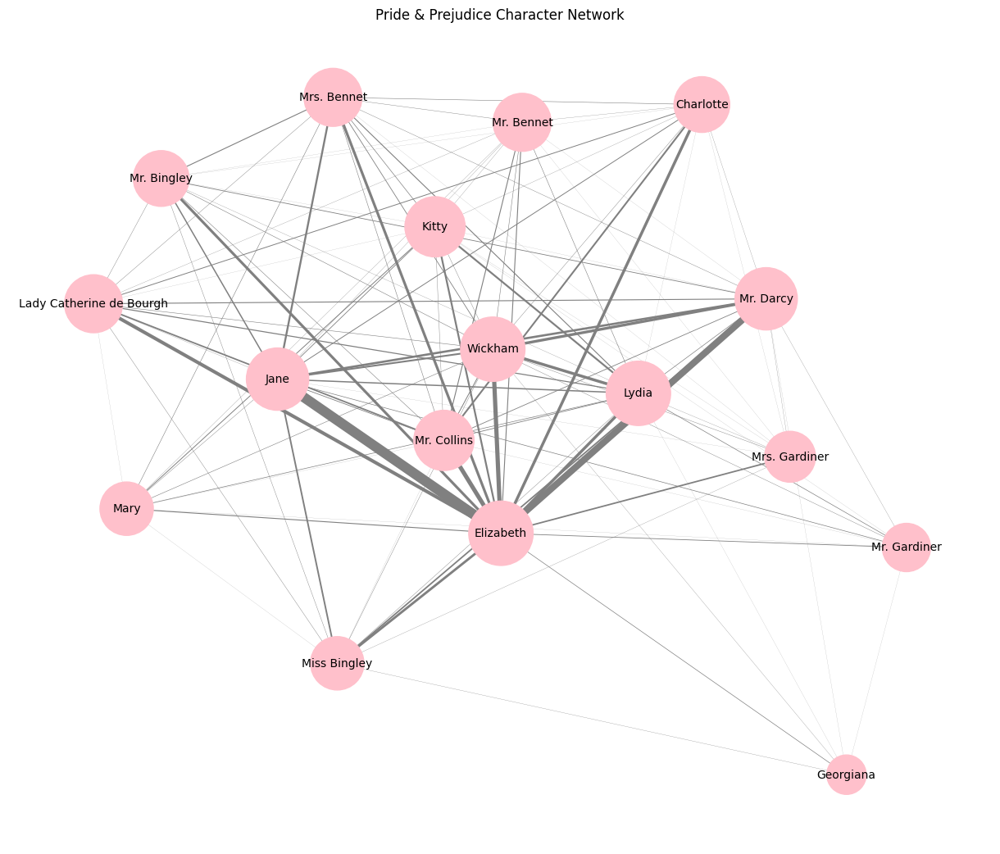

In [ ]:
#Pride & Prejudice basic network graph with weighted ties
#https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.bipartite.centrality.degree_centrality.html#networkx.algorithms.bipartite.centrality.degree_centrality
#https://python.igraph.org/en/latest/tutorial.html#creating-a-graph

import networkx as nx
import matplotlib.pyplot as plt

# Create a directed graph from the DataFrame
G = nx.from_pandas_edgelist(character_co_occurrence_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [G[u][v]['Co-occurrence Count'] for u, v in G.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights]

# Calculate the degree of each node (number of connections)
degrees = [G.degree(node) for node in G.nodes()]
scaled_node_sizes = [d * 200 for d in degrees]

# Draw the graph
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, k=0.5, iterations=50)
nx.draw(G, pos, with_labels=True, node_color='pink', node_size=scaled_node_sizes, edge_color='gray',
        width=scaled_weights, linewidths=1, font_size=10)

plt.title("Pride & Prejudice Character Network")
plt.show()

The graph above shows a weighted network where the size of the node is based on the number of connections that character has (how many other characters they interact with), and the thickness of the edge (connecting line) is based on how many interactions those two characters have together.

Based on the graph above, characters such as Mary, the Gardiners or Georgiana have smaller circles and thus are connected to fewer characters than more promiment members of the network such as Lizzy. These characters know fewer people, they interact less often, and are more likely to be minor characters.

We can also see that Lizzy is most likely to interact with Jane, then Mr. Darcy. Mr. Wickham also has more iteractions with Lizzy than he does with Lydia, whom he marries, causing great scandal. This is expected since the story is told from Lizzy's perspective. She's the focus of the story, and the reader is only privvy to information when she knows it, such as in the case of Lydia's elopment. We do not actually *see* Wickham courting Lydia in secret, we only hear about it after the fact.

One interesting thing to notice is that Lizzy interacts most with her sister Jane, despite the premise of the book being Lizzy falling in love with Mr. Darcy. This speaks not only to the propriety of the time, but the deep bonds of sisterhood that Jane and Lizzy share. However, of note, Lizzy doesn't interact with her other sisters with this frequency.

Next, I look at some statistics about the first network. Primarily, it's size and shape.

In [ ]:
#Pride & Prejudice Calculate network-level statistics

# Number of nodes and edges
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()

# Network Density
density = nx.density(G)

# Average Degree
# For an undirected graph, average degree is (2 * num_edges) / num_nodes
avg_degree = sum(dict(G.degree()).values()) / num_nodes

# Average Clustering Coefficient
avg_clustering_coefficient = nx.average_clustering(G)

# Diameter (only for connected graphs, check first)
if nx.is_connected(G):
    diameter = nx.diameter(G)
else:
    diameter = "Graph is not connected, cannot calculate diameter."

# Assortativity (Degree Assortativity)
assortativity = nx.degree_assortativity_coefficient(G)

print(f"Number of Nodes: {num_nodes}")
print(f"Number of Edges: {num_edges}")
print(f"Network Density: {density:.4f}")
print(f"Average Degree: {avg_degree:.4f}")
print(f"Average Clustering Coefficient: {avg_clustering_coefficient:.4f}")
print(f"Diameter: {diameter}")
print(f"Degree Assortativity: {assortativity:.4f}")

Number of Nodes: 17
Number of Edges: 108
Network Density: 0.7941
Average Degree: 12.7059
Average Clustering Coefficient: 0.8593
Diameter: 2
Degree Assortativity: -0.1829


Network density refers to the ratio between the number of edges in a network vs the potentially number of edges if each node was connected to each other node. Said another way: it is a measure of if each member of the network is connected to each other member. In the *Pride and Prejudice* network, the density is quite high at 0.74. And so, most characters do, in fact, interact with most other characters. This goes hand in hand with the average degree, which is the average number of connections per node, in this case 11. There are only 17 total nodes, and so most nodes, or characters are connected to almost all other nodes.

Also evident from the graph, this network does not have any isolates and all characters are connected to more than one character.

The diameter of the network is a measure of how far apart two nodes are from each other and how many nodes come in between. In this case, the diameter is 2, which is very small.

The clustering coefficient and degree assortativity refer to the tendancy of nodes to form groups with similar nodes. In this network, all the nodes are in one large group together without visible subgroups.

In [ ]:
#Pride & Prejudice centrality analysis

degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G)

print("Degree Centrality:")
print(degree_centrality)

print("\nBetweenness Centrality:")
print(betweenness_centrality)

print("\nCloseness Centrality:")
print(closeness_centrality)

print("\nEigenvector Centrality:")
print(eigenvector_centrality)

#sort descending

Degree Centrality:
{'Charlotte': 0.75, 'Elizabeth': 1.0, 'Jane': 0.9375, 'Lydia': 1.0, 'Mr. Bennet': 0.8125, 'Mr. Bingley': 0.75, 'Mr. Darcy': 0.9375, 'Mrs. Bennet': 0.8125, 'Georgiana': 0.375, 'Miss Bingley': 0.6875, 'Mr. Gardiner': 0.5625, 'Wickham': 1.0, 'Kitty': 0.875, 'Lady Catherine de Bourgh': 0.8125, 'Mary': 0.6875, 'Mr. Collins': 0.875, 'Mrs. Gardiner': 0.625}

Betweenness Centrality:
{'Charlotte': 0.0025000000000000005, 'Elizabeth': 0.03478204665704666, 'Jane': 0.017420935545935545, 'Lydia': 0.03478204665704666, 'Mr. Bennet': 0.006058501683501684, 'Mr. Bingley': 0.0034259259259259256, 'Mr. Darcy': 0.029556878306878306, 'Mrs. Bennet': 0.006058501683501684, 'Georgiana': 0.0010416666666666667, 'Miss Bingley': 0.0145770202020202, 'Mr. Gardiner': 0.0068686868686868695, 'Wickham': 0.03478204665704666, 'Kitty': 0.012953342953342953, 'Lady Catherine de Bourgh': 0.005942760942760943, 'Mary': 0.006666666666666667, 'Mr. Collins': 0.012490379990379991, 'Mrs. Gardiner': 0.0034259259259259

Centrality refers to whether the network revolves around one node, or a small group of nodes. There are different flavors of centrality: degree (number of connections), betweenness (short paths between indirectly connected nodes), closeness (path distance of one node to the other nodes - so, they'd all have short paths), eigenvector (potential influence of a node.)

This network is decentralized. There isn't really one node, or group of nodes that functions as the center of the network. This means the degree and closeness centrality are quite high, but the betweenness and eigenvector centrality is lower since no one person holds authority over the others and there are no bottle necks in the network where one person acts as a sort of gatekeeper to the others.

In this network, the characters associate freely with one another. This may be unexpected given the strict social norms of the time.

Now, let's repeat the process with *Sense & Sensibility* and *Emma*.

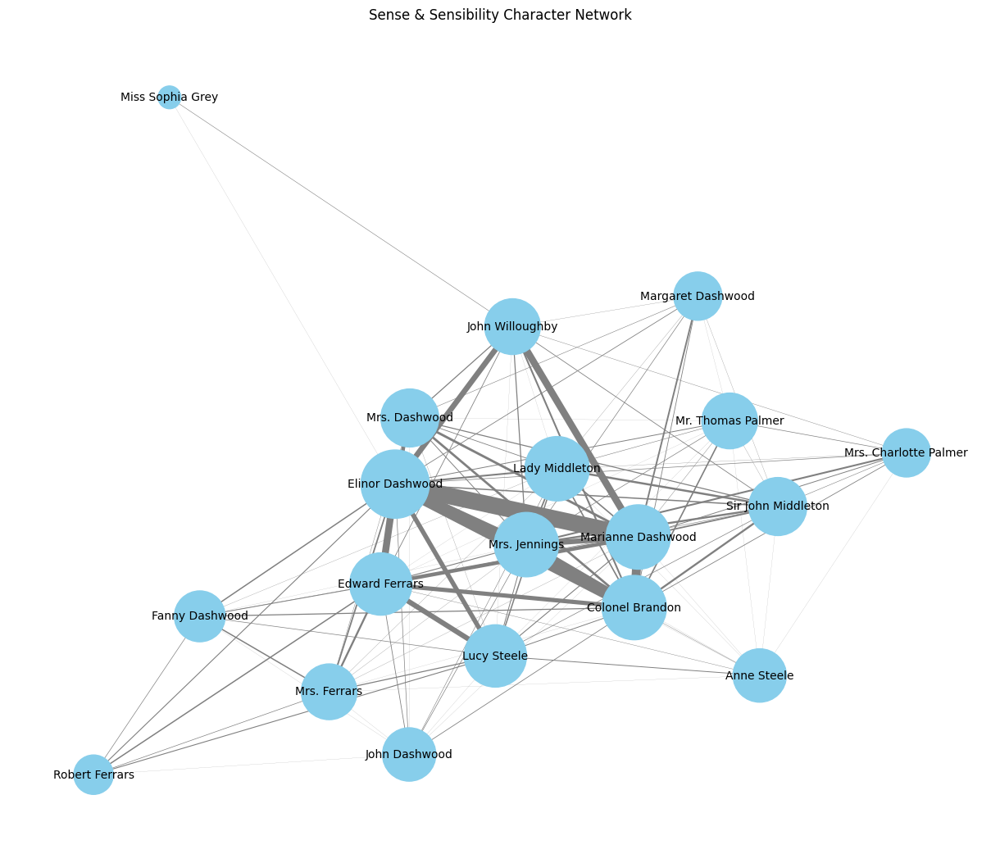

In [ ]:
#basic network graph with weighted ties - Sense & Sensibility
#https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.bipartite.centrality.degree_centrality.html#networkx.algorithms.bipartite.centrality.degree_centrality
#https://python.igraph.org/en/latest/tutorial.html#creating-a-graph

import networkx as nx
import matplotlib.pyplot as plt

# Create a directed graph from the DataFrame
G_s = nx.from_pandas_edgelist(character_co_occurrence_df_s,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [G_s[u][v]['Co-occurrence Count'] for u, v in G_s.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights]

# Calculate the degree of each node (number of connections)
degrees = [G_s.degree(node) for node in G_s.nodes()]
scaled_node_sizes = [d * 200 for d in degrees]

# Draw the graph
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G_s, k=0.5, iterations=50)
nx.draw(G_s, pos, with_labels=True, node_color='skyblue', node_size=scaled_node_sizes, edge_color='gray',
        width=scaled_weights, linewidths=1, font_size=10)

plt.title("Sense & Sensibility Character Network")
plt.show()

Here again, we see the network is decentralized with most characters having ties to each other. Marianne, the protagonist is most connected to her sister Elinor, the other protagonist, and then her love interest Colonel Brandon. Elinor has strong connections to her own love interests. Sophia Gray is the lest connected character, and isn't connected to Marianne at all, only Elinor and John Willoughby.

Here again we see the strength of sisterly bonds reflected in Austen's writing.

In [ ]:
# Calculate network-level statistics - Sense & Sensibility

# Number of nodes and edges
num_nodes = G_s.number_of_nodes()
num_edges = G_s.number_of_edges()

# Network Density
density = nx.density(G_s)

# Average Degree
# For an undirected graph, average degree is (2 * num_edges) / num_nodes
avg_degree = sum(dict(G_s.degree()).values()) / num_nodes

# Average Clustering Coefficient
avg_clustering_coefficient = nx.average_clustering(G_s)

# Diameter (only for connected graphs, check first)
if nx.is_connected(G_s):
    diameter = nx.diameter(G_s)
else:
    diameter = "Graph is not connected, cannot calculate diameter."

# Assortativity (Degree Assortativity)
assortativity = nx.degree_assortativity_coefficient(G_s)

print(f"Number of Nodes: {num_nodes}")
print(f"Number of Edges: {num_edges}")
print(f"Network Density: {density:.4f}")
print(f"Average Degree: {avg_degree:.4f}")
print(f"Average Clustering Coefficient: {avg_clustering_coefficient:.4f}")
print(f"Diameter: {diameter}")
print(f"Degree Assortativity: {assortativity:.4f}")

Number of Nodes: 19
Number of Edges: 116
Network Density: 0.6784
Average Degree: 12.2105
Average Clustering Coefficient: 0.8470
Diameter: 2
Degree Assortativity: -0.1920


*Sense & Sensibility* and *Pride & Prejudice* are certainly very similar books. They have a similar number of nodes (17 vs 19), as well as similar densities (0.68 vs 0.74), degrees (11.9 vs 12.2), and clustering coefficients (0.83 vs 0.85). They have the same diameter. This is numerical evidence that the characters in both stories are highly inter-connected and there are not clear distinctions between groups of characters.

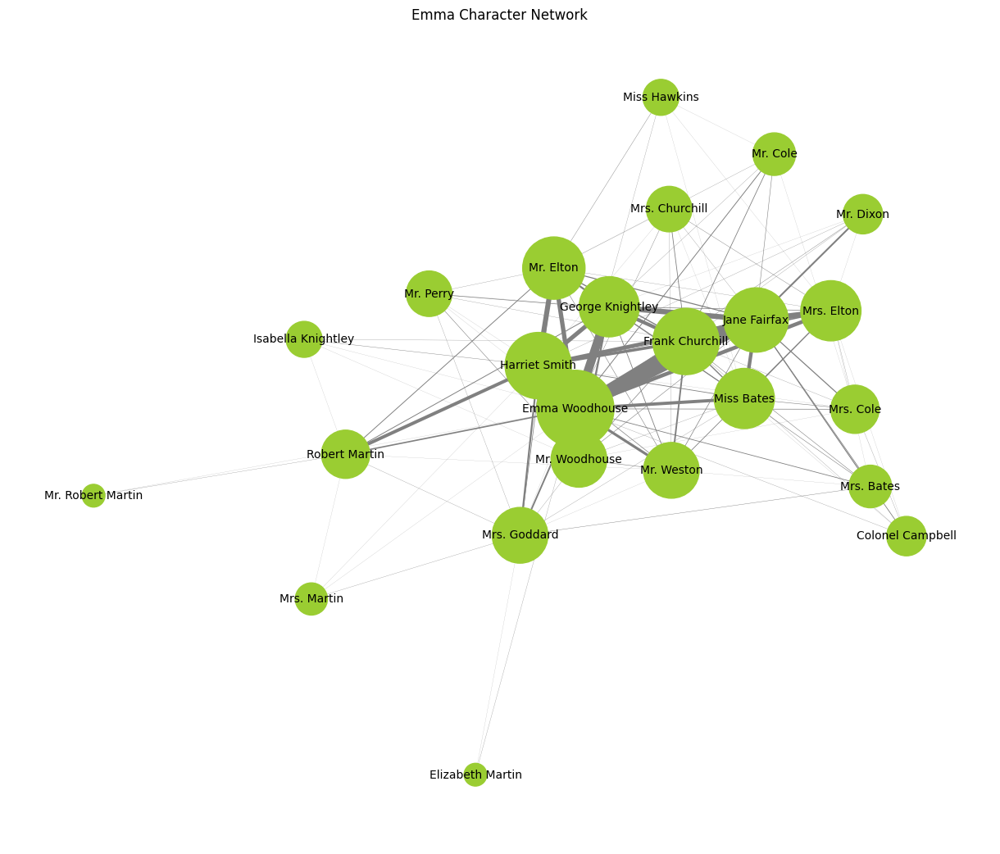

In [ ]:
#Emma basic network graph with weighted ties - Emma
#https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.bipartite.centrality.degree_centrality.html#networkx.algorithms.bipartite.centrality.degree_centrality
#https://python.igraph.org/en/latest/tutorial.html#creating-a-graph

import networkx as nx
import matplotlib.pyplot as plt

# Create a directed graph from the DataFrame
G_e = nx.from_pandas_edgelist(character_co_occurrence_df_e,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [G_e[u][v]['Co-occurrence Count'] for u, v in G_e.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights]

# Calculate the degree of each node (number of connections)
degrees = [G_e.degree(node) for node in G_e.nodes()]
scaled_node_sizes = [d * 200 for d in degrees]

# Draw the graph
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G_e, k=0.5, iterations=50)
nx.draw(G_e, pos, with_labels=True, node_color='yellowgreen', node_size=scaled_node_sizes, edge_color='gray',
        width=scaled_weights, linewidths=1, font_size=10)

plt.title("Emma Character Network")
plt.show()

The Emma network, at least visually, looks more centralized with a clear core grup of characters that includes, Emma, George, the Eltons, Jane, Harriet, Frank, and to a lesser extent Miss Bates and Mr. Woodhouse, and then a periphery of characters. Mrs. Dixon and Mr. Martin are the least connected characters.

In [ ]:
#Emma Calculate network-level statistics - Sense & Sensibility

# Number of nodes and edges
num_nodes = G_e.number_of_nodes()
num_edges = G_e.number_of_edges()

# Network Density
density = nx.density(G_e)

# Average Degree
# For an undirected graph, average degree is (2 * num_edges) / num_nodes
avg_degree = sum(dict(G_e.degree()).values()) / num_nodes

# Average Clustering Coefficient
avg_clustering_coefficient = nx.average_clustering(G_e)

# Diameter (only for connected graphs, check first)
if nx.is_connected(G_e):
    diameter = nx.diameter(G_e)
else:
    diameter = "Graph is not connected, cannot calculate diameter."

# Assortativity (Degree Assortativity)
assortativity = nx.degree_assortativity_coefficient(G_e)

print(f"Number of Nodes: {num_nodes}")
print(f"Number of Edges: {num_edges}")
print(f"Network Density: {density:.4f}")
print(f"Average Degree: {avg_degree:.4f}")
print(f"Average Clustering Coefficient: {avg_clustering_coefficient:.4f}")
print(f"Diameter: {diameter}")
print(f"Degree Assortativity: {assortativity:.4f}")

Number of Nodes: 24
Number of Edges: 122
Network Density: 0.4420
Average Degree: 10.1667
Average Clustering Coefficient: 0.7533
Diameter: 2
Degree Assortativity: -0.3335


*Emma* has more characters than the other two books, with 24 nodes (vs fewer than 20). However, it has roughly the same number of edges. Thus, some of the characters are less well connected than those of the other two books. This is reflected in the higher diameter, lower average degree, and lower network density. The characters in *Emma* are not as interconnected as in the other two books.

Next, we'll look at the personal networks of a few of the characers. These are called egonetworks. As we said, almost all characters associate with almost all other characters, and so most characters will still be in most ego-networks with a few exceptions, especially in *Emma*.

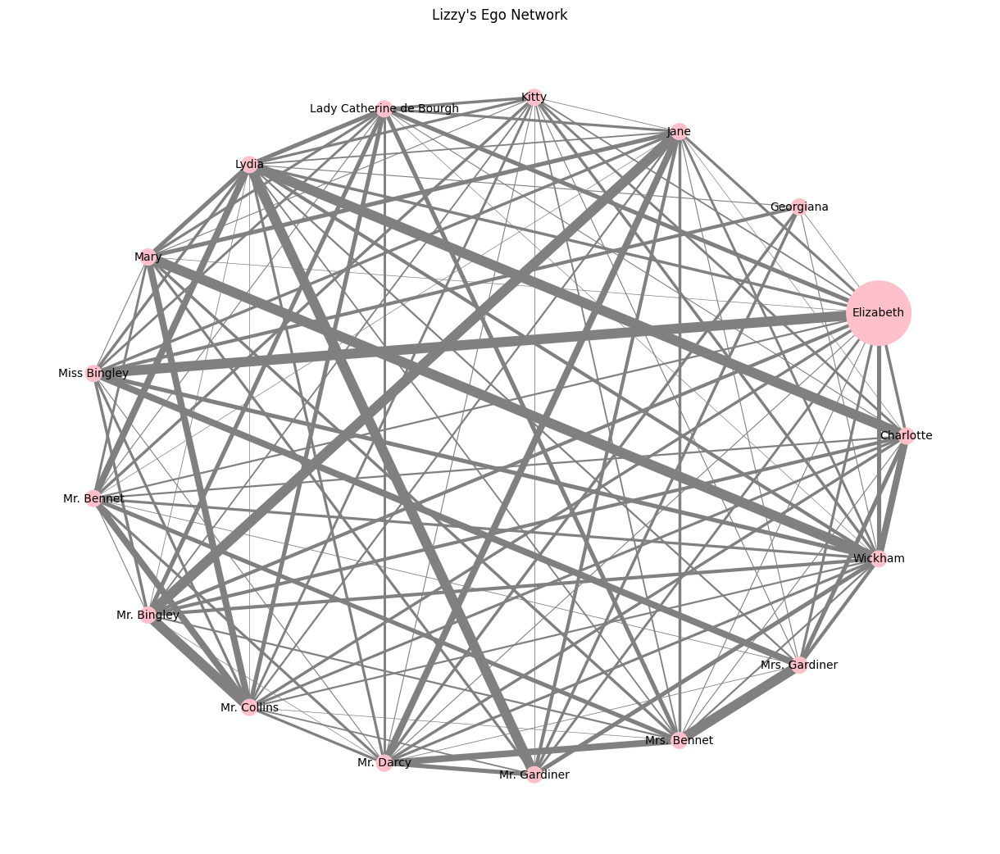

In [ ]:
#Lizzy's egonetwork

lizzy_df = character_co_occurrence_df[character_co_occurrence_df["Character 2"] == "Elizabeth"]
lizzy_df
#create a data set for only that character

lizzy = nx.from_pandas_edgelist(lizzy_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [lizzy[u][v]['Co-occurrence Count'] for u, v in lizzy.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

# Calculate the degree of each node (number of connections)
degrees = [lizzy.degree(node) for node in lizzy.nodes()]
scaled_node_sizes = [d * 200 for d in degrees] # Example scaling factor

# Draw the graph
plt.figure(figsize=(12, 10))
pos = nx.circular_layout(lizzy)
nx.draw(G, pos, with_labels=True, node_color='pink', node_size=scaled_node_sizes, edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)

plt.title("Lizzy's Ego Network")
plt.show()

Lizzy's ego network is the network. Every character is connected to Lizzy. This is logical as she is the main character and the book, while in 3rd person, is from her perspective.

Next, the ego network of the main love interest: Mr. Darcy.

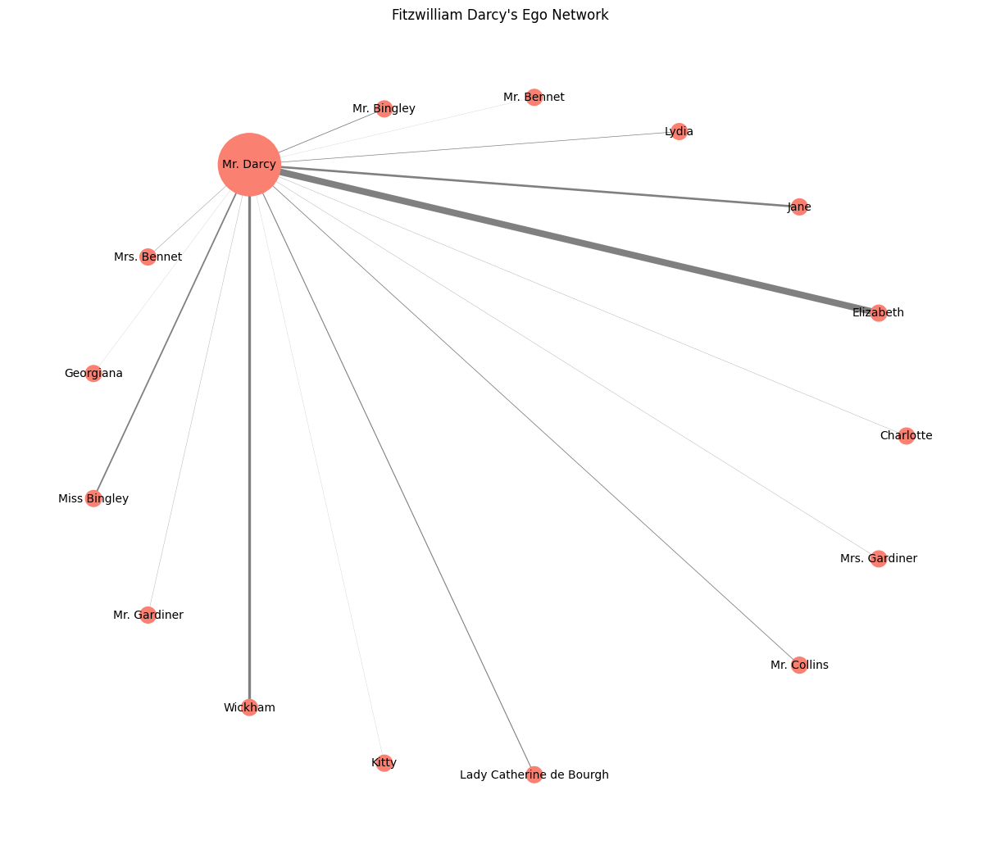

In [ ]:
#Ego Network - Darcy

darcy_df = character_co_occurrence_df[(character_co_occurrence_df["Character 1"] == "Mr. Darcy") | (character_co_occurrence_df["Character 2"] == "Mr. Darcy")]

darcy = nx.from_pandas_edgelist(darcy_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [darcy[u][v]['Co-occurrence Count'] for u, v in darcy.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

# Calculate the degree of each node (number of connections)
degrees = [darcy.degree(node) for node in darcy.nodes()]
scaled_node_sizes = [d * 200 for d in degrees] # Example scaling factor

# Calculate positions for the entire graph G
pos = nx.circular_layout(G)

# Draw only the nodes and edges of the 'caroline' ego network using positions from G
plt.figure(figsize=(12, 10))
nx.draw(darcy, pos, with_labels=True, node_color='salmon', node_size=scaled_node_sizes, edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)

plt.title("Fitzwilliam Darcy's Ego Network")
plt.show()

Mr. Darcy's egonetwork is misleading. For one thing, he somehow isn't connected to his own sister. This is most likely a shortcoming of the methodology. He also isn't connected to Mary, but is connected to the bulk of the characters. He is connected most strongly with Wickham, his childhood frenemy, as well as Jane and Caroline, and, of course, Lizzy. It seems that even though Lizzy swore to loath Mr. Darcy for all eternity, their relationship is one of the most strongly attested in the book.

He is only very loosely connected to his aunt Lady Catherine de Bourgh, and the Gardeners, though, presumably, he negotiates the specifics of Lydia's marriage to Mr. Wickham with the Gardiners. All these interactions happen off screen and are thus not represented in his ego network.

Perhaps the notable gaps in his ego network reflect how much of a long wolf he is; working in the shadows and never on the page. But, more likely they are reflective of the book's bias for scenes witnessed direcly by Lizzy.

Next, we will repeat the process with the protagonists of *Sense & Sensibility* and *Emma*.

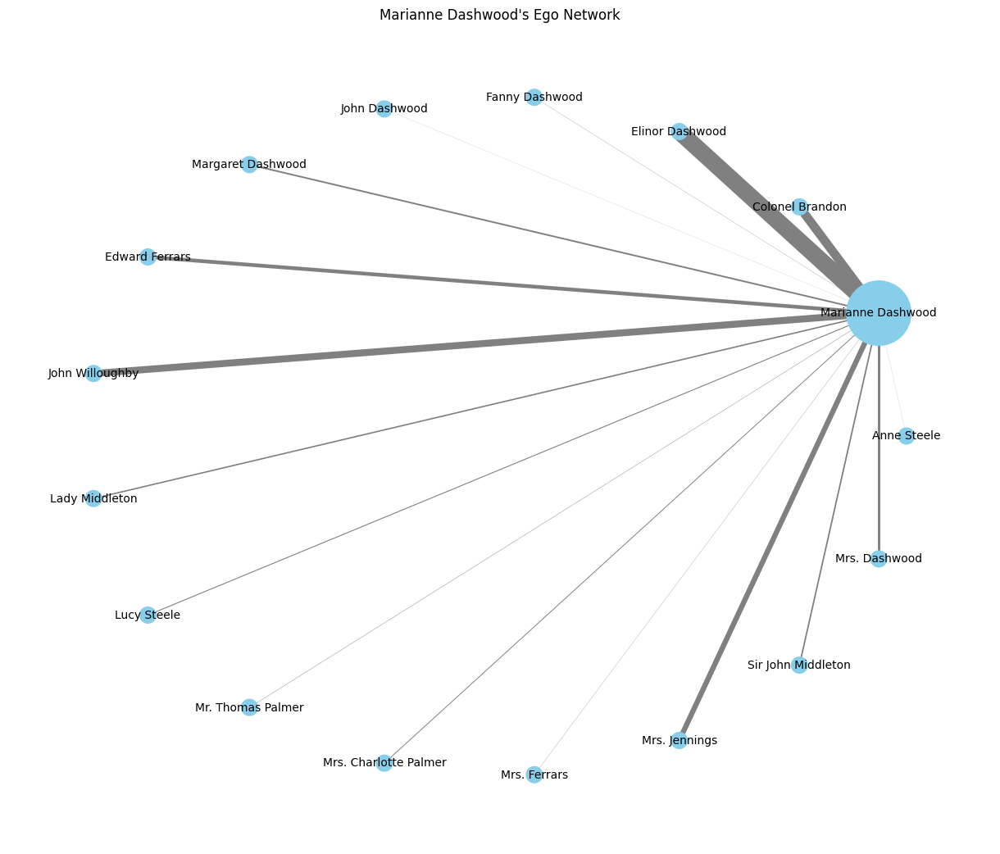

In [ ]:
#Marianne's egonetwork

marianne_df = character_co_occurrence_df_s[(character_co_occurrence_df_s["Character 1"] == "Marianne Dashwood") | (character_co_occurrence_df_s["Character 2"] == "Marianne Dashwood")]
marianne_df

marianne = nx.from_pandas_edgelist(marianne_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [marianne[u][v]['Co-occurrence Count'] for u, v in marianne.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

# Calculate the degree of each node (number of connections)
degrees = [marianne.degree(node) for node in marianne.nodes()]
scaled_node_sizes = [d * 200 for d in degrees] # Example scaling factor

# Draw the graph
plt.figure(figsize=(12, 10))
pos = nx.circular_layout(marianne)
nx.draw(marianne, pos, with_labels=True, node_color='skyblue', node_size=scaled_node_sizes, edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)

plt.title("Marianne Dashwood's Ego Network")
plt.show()

Marianne is most connected to her sister Elinor, and then her two love interests. Colonel Brandon is more strongly connected than John Willoughby. She is not connected to Sophia Gray or Robert Ferras.

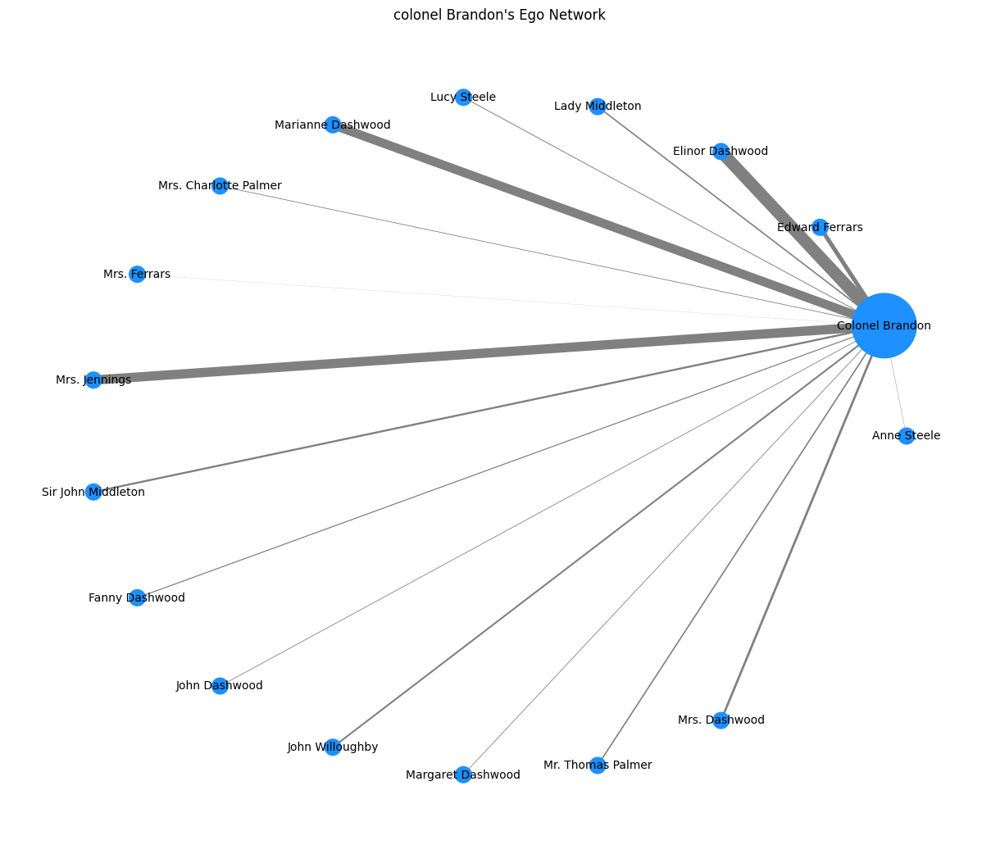

In [ ]:
#Ego Network - Colonel Brandon

colonel_df = character_co_occurrence_df_s[(character_co_occurrence_df_s["Character 1"] == "Colonel Brandon") | (character_co_occurrence_df_s["Character 2"] == "Colonel Brandon")]

colonel = nx.from_pandas_edgelist(colonel_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [colonel[u][v]['Co-occurrence Count'] for u, v in colonel.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

# Calculate the degree of each node (number of connections)
degrees = [colonel.degree(node) for node in colonel.nodes()]
scaled_node_sizes = [d * 200 for d in degrees] # Example scaling factor

# Calculate positions for the entire graph G
pos = nx.circular_layout(G_s)

# Draw only the nodes and edges of the 'caroline' ego network using positions from G
plt.figure(figsize=(12, 10))
nx.draw(colonel, pos, with_labels=True, node_color='dodgerblue', node_size=scaled_node_sizes, edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)

plt.title("colonel Brandon's Ego Network")
plt.show()

Colonel Brandon is also very well connected. He is also not connected to Sophia or Robert. However, what is interesting here is that he is actually more connected to Elinor Dashwood than to Marianne, despite being Marianne's love interest and not Elinor's.

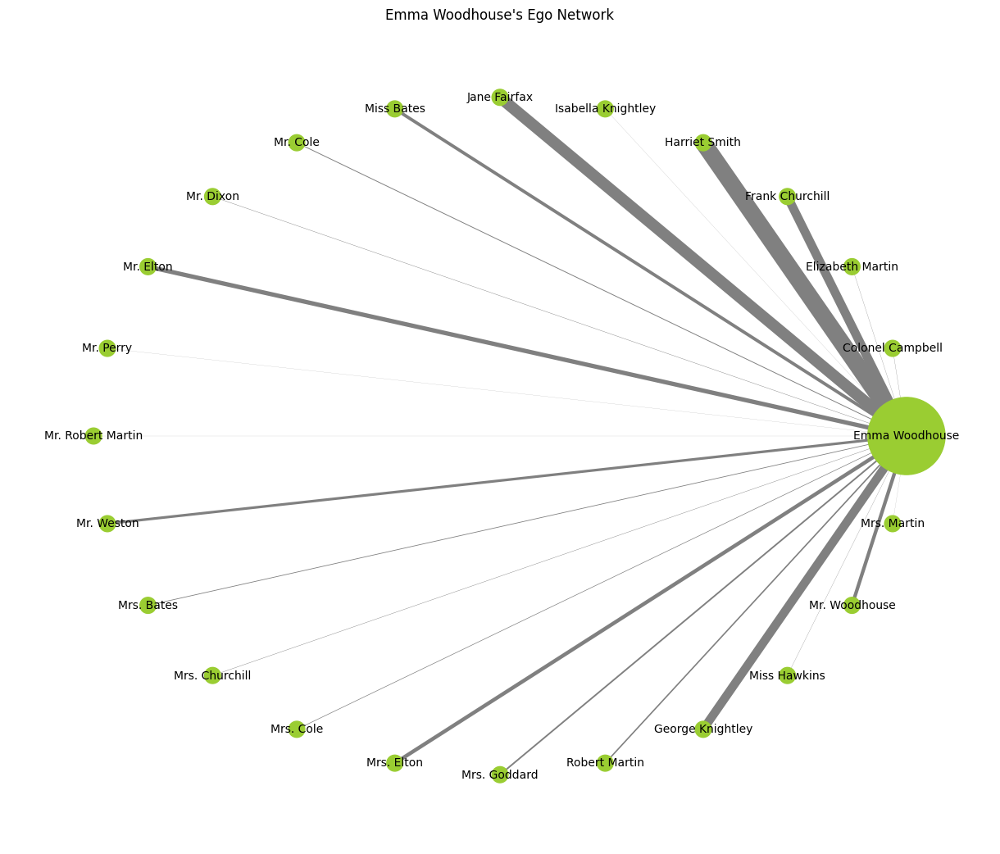

In [ ]:
#Emma's egonetwork

emma_df = character_co_occurrence_df_e[(character_co_occurrence_df_e["Character 1"] == "Emma Woodhouse") | (character_co_occurrence_df_e["Character 2"] == "Emma Woodhouse")]
emma_df

emma = nx.from_pandas_edgelist(emma_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [emma[u][v]['Co-occurrence Count'] for u, v in emma.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

# Calculate the degree of each node (number of connections)
# Correctly iterate over the nodes of the 'emma' graph for its ego network.
degrees = [emma.degree(node) for node in emma.nodes()]
scaled_node_sizes = [d * 200 for d in degrees] # Example scaling factor

# Draw the graph
plt.figure(figsize=(12, 10))
# Use 'emma' graph for layout calculation, not 'G_e'
pos = nx.circular_layout(emma)
nx.draw(emma, pos, with_labels=True, node_color='yellowgreen', node_size=scaled_node_sizes, edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)

plt.title("Emma Woodhouse's Ego Network")
plt.show()

Emma is most connected to her best friend Harriet. This is logical as she spends much of the novel in Harriet's company. This may also be reflective of the strict gender separation of the time; it would not have been proper for her to spend time with any potential suitors alone. What is interesting in Emma's network is that the relationship with her main rival Jane Fairfax is so strong, while the relationships between her two potential suitors, George and Frank are about equal. Clearly, Emma spends more time concerned with one-upping Jane than she does worrying about her actual marriage prospects.

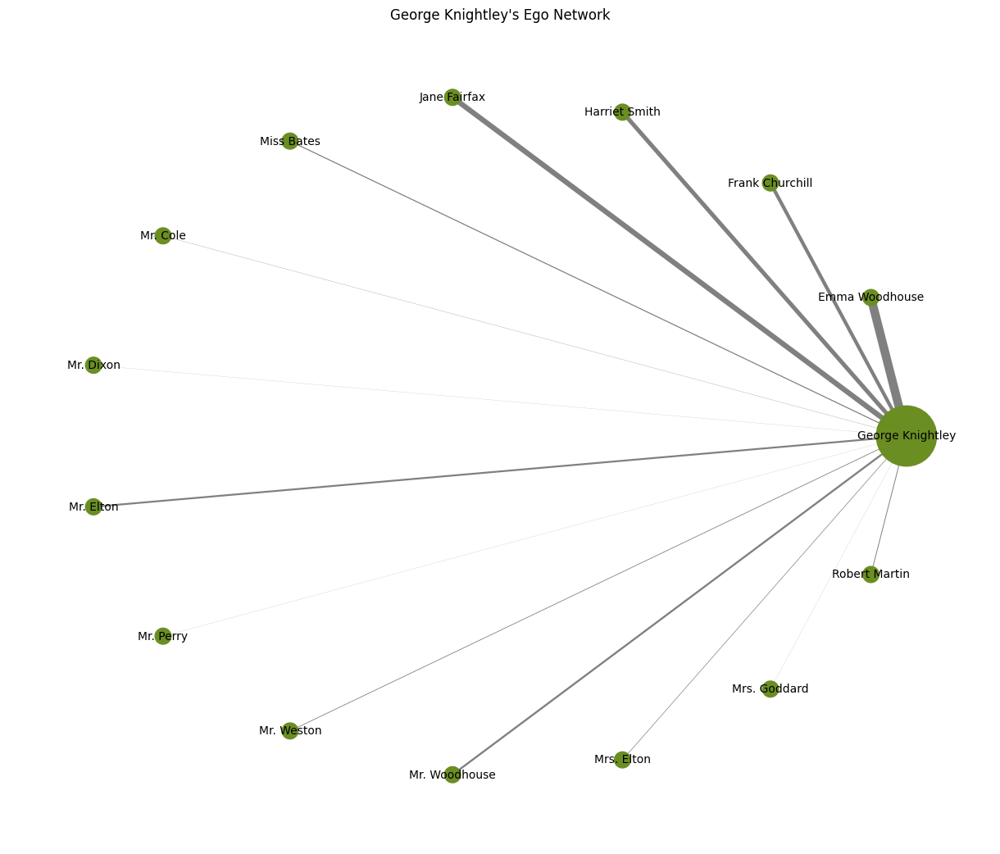

In [ ]:
#Ego Network - George Knightley

# Correctly filter for George Knightley from the Emma co-occurrence DataFrame
george_df = character_co_occurrence_df_e[(character_co_occurrence_df_e["Character 1"] == "George Knightley") | (character_co_occurrence_df_e["Character 2"] == "George Knightley")]

# Create the graph from the correctly filtered george_df
george = nx.from_pandas_edgelist(george_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')

# Get the edge weights
weights = [george[u][v]['Co-occurrence Count'] for u, v in george.edges()]

# Scale the weights for better visualization (adjust the scaling factor as needed)
scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

# Calculate the degree of each node (number of connections)
degrees = [george.degree(node) for node in george.nodes()]
scaled_node_sizes = [d * 200 for d in degrees] # Example scaling factor

# Calculate positions for the ego network based on its own nodes
plt.figure(figsize=(12, 10))
pos = nx.circular_layout(george)

# Draw the ego network
nx.draw(george, pos, with_labels=True, node_color='olivedrab', node_size=scaled_node_sizes, edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)

plt.title("George Knightley's Ego Network")
plt.show()

George's strongst relationship is with Emma. However, he does have multiple on-page interactions with Frank, Harriet, and Jane, which is reflective not only of the fact that all these characters are the focus of the book, but also of Emma's preoccupation and relationships with these characters.

As we have seen, the networks in *Pride & Prejudice* and *Sense & Sensibility* are very closely knit with most characters knowing, interacting with, or gossiping about most other characters. *Emma* is slightly more centralized, and the characters are slightly less involved with each other.

Another way to analyse the ties within a network is by looking at the Simmelian ties. Simmelian ties occur when there are three or more nodes (characters) that are all connected to each other. This forms a very strong bond between these nodes. Ergo, characters in the novel who are connected with Simmelian ties interact often, functioning as almost a little unit unto themselves.

It would be interesting to see which characters are more closely linked together.

In [ ]:
%pip install cpnet

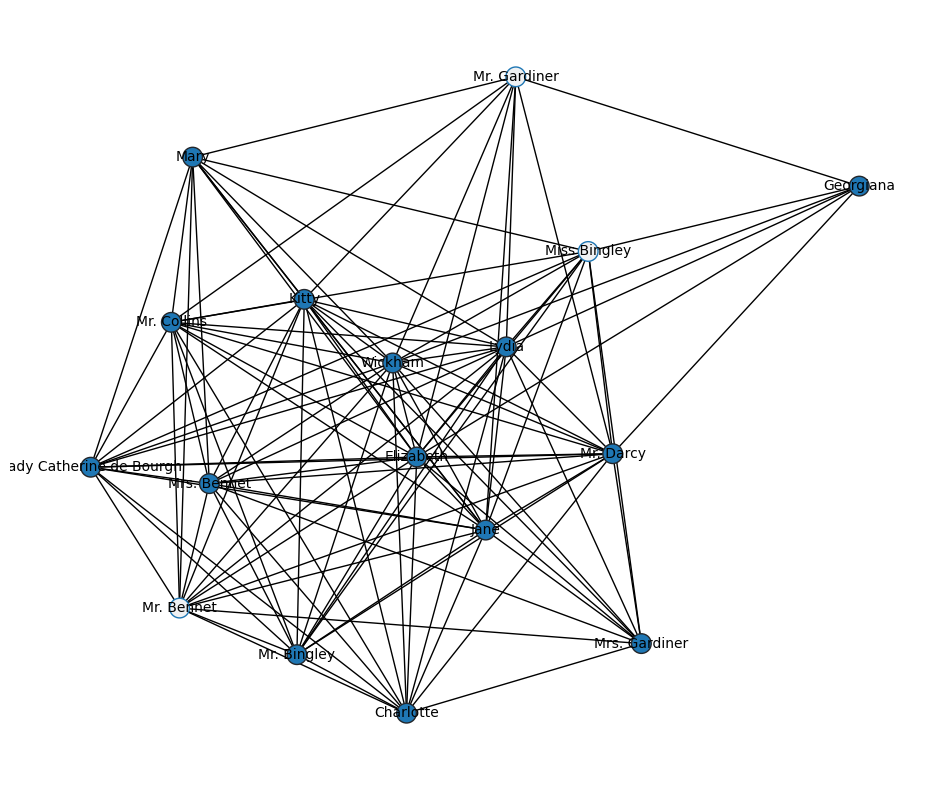

In [ ]:
#Simmelian ties - Pride & Prejudice

import cpnet
import networkx as nx
import matplotlib.pyplot as plt

# Use the graph G that was created earlier from the character co-occurrence data
algorithm = cpnet.KM_config()

algorithm.detect(G)

c = algorithm.get_pair_id()
x = algorithm.get_coreness()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Get node labels from the graph - these should already be the character names
node_labels = {node: node for node in G.nodes()}


ax, pos = cpnet.draw(G, c, x, ax, max_group_num = None, draw_edge=True, draw_nodes_kwd={'node_size': 200}, draw_edges_kwd={})

# Draw labels separately
nx.draw_networkx_labels(G, pos, labels=node_labels, ax=ax, font_size=10)

plt.show()

When looking at the Pride and Prejudice network through the lense of Simmelian ties, the network looks mostly the same, with characters who share Simmelian ties being in the darker blue, and characters who do not having the transparent, light blue circles.

Many characters in the Bennet family all share Simmelian ties. This is both expected and nice. It shows how close the family is. Except for Mr. Bennet, who is left out. He usually wants to spend time in his study away from his family, and this shows it.

Despite being Jane's main antagonist and taking up a good bit of concern at the beginning of the novel, Caroline Bingley does not have simmelian ties.

Mr. Gardiner is also exclided This may be expected for the Gardiners are they are minor characters who mainly interact via letter and the occasional visit, as they do not live near the Bennet family.

Now we will repeat the process with *Sense & Sensibility* and *Emma*.

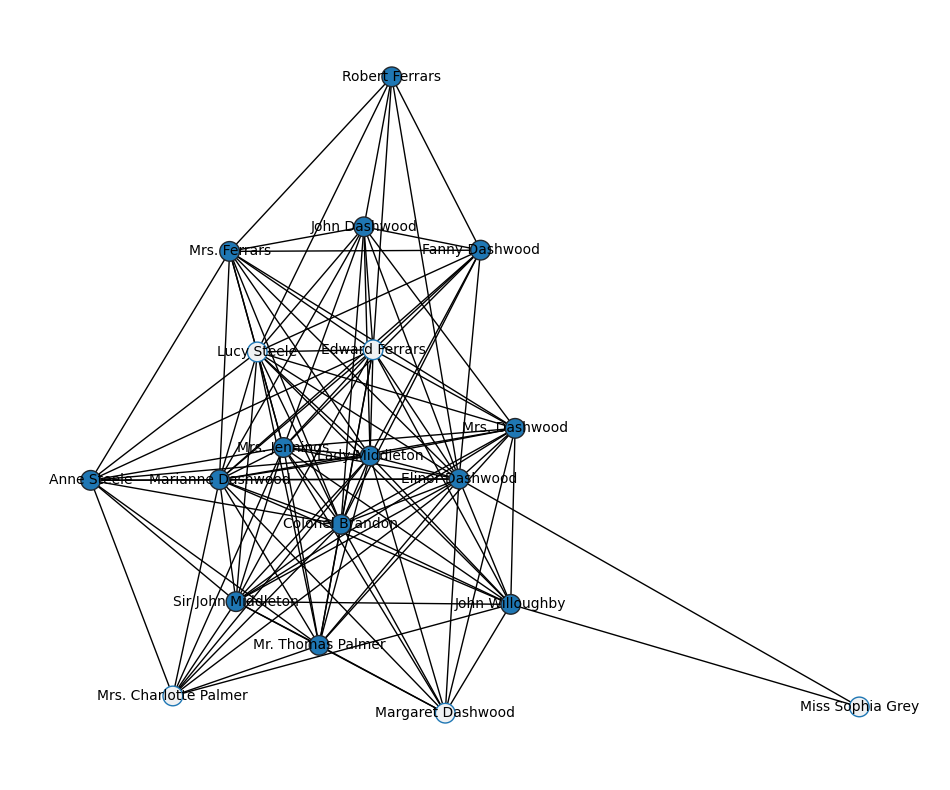

In [ ]:
#Simmelian ties - Sense & Sensibility

# Use the graph G that was created earlier from the character co-occurrence data
algorithm = cpnet.KM_config()

algorithm.detect(G_s)

c = algorithm.get_pair_id()
x = algorithm.get_coreness()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Get node labels from the graph - these should already be the character names
node_labels = {node: node for node in G_s.nodes()}


ax, pos = cpnet.draw(G_s, c, x, ax, max_group_num = None, draw_edge=True, draw_nodes_kwd={'node_size': 200}, draw_edges_kwd={})

# Draw labels separately
nx.draw_networkx_labels(G_s, pos, labels=node_labels, ax=ax, font_size=10)

plt.show()

Echoing the results of the anlaysis in *Pride & Prejudice*, here again the characters already identified to be less connected, such as Sophia, are do not share simmelian ties with the other characters (Sophia only has two total connections). This highlights the odd mileu of some well-connected characters such as Margaret, Lucy, and Edward. Despite knowing many people, they may not be embedded in a "group" and float around from scene to scene interacting with different people. This may also be related  to their puprose in the story, such as in the case of Lucy Steele who is a sort of antagonist showing up to foil the main characters.

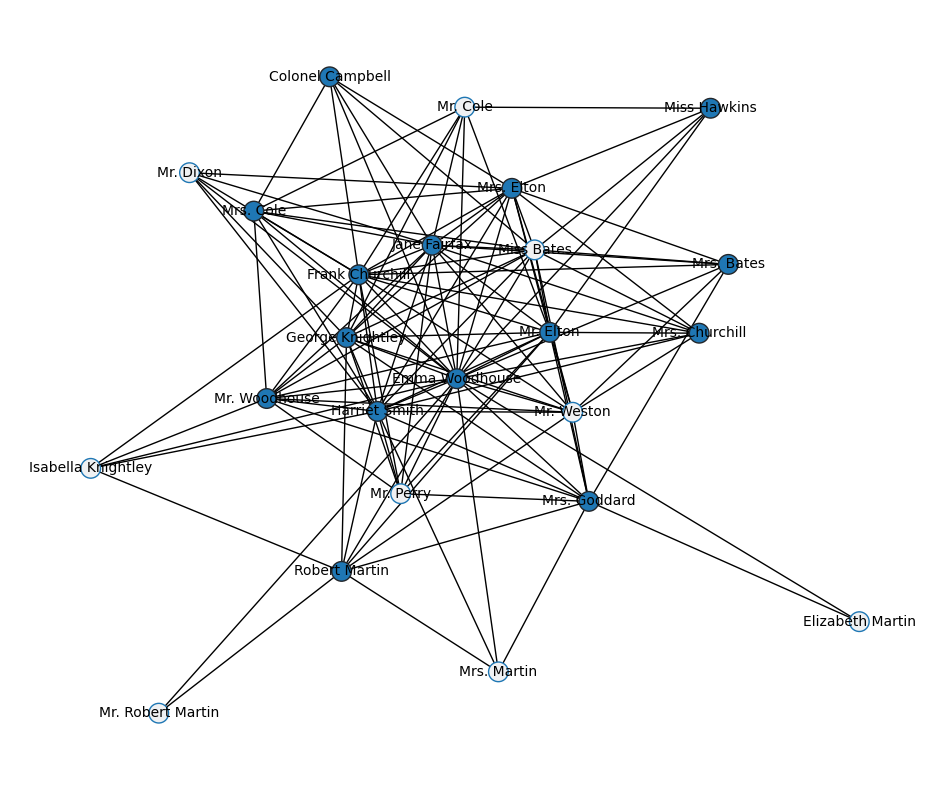

In [ ]:
#Simmelian ties - Emma

# Use the graph G that was created earlier from the character co-occurrence data
algorithm = cpnet.KM_config()

algorithm.detect(G_e)

c = algorithm.get_pair_id()
x = algorithm.get_coreness()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 10))

# Get node labels from the graph - these should already be the character names
node_labels = {node: node for node in G_e.nodes()}


ax, pos = cpnet.draw(G_e, c, x, ax, max_group_num = None, draw_edge=True, draw_nodes_kwd={'node_size': 200}, draw_edges_kwd={})

# Draw labels separately
nx.draw_networkx_labels(G_e, pos, labels=node_labels, ax=ax, font_size=10)

plt.show()

The situation in Emma is a bit different with a much cleared deliniation of primary and secondary characters. The blue group is Emma's inner circle, containing the titular character, her family, and friends, while the unfilled group contains characters who Emma rarely, or begrudgingly associates with, but who are ever present such as Miss. Bates. This indicates how prominent the "antagonists" are in the novel.

But what about larger cliques? While the Simmelian ties will highlight the characters with the strongest bonds, they do not show the whole picture. A clique is a set of notes that are connected so that each node is connected to each other node. A Simmelian tie is a 3-person clique. So, what this means is that while everyone can be put into a group of 3 people, not everyone is in the same group of 3 people. Non-simmelian cliquest provide the opportunity to see groups of characters without requiring all characters in the group to be connected in the same with. This increased freedom allows more characters to be in the group together, showing different trends than a strict Simmelian ties analysis.

All cliques: [['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Miss Bingley', 'Mrs. Gardiner', 'Mr. Darcy'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Miss Bingley', 'Lady Catherine de Bourgh', 'Mr. Collins', 'Mr. Darcy', 'Mr. Bingley'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Miss Bingley', 'Lady Catherine de Bourgh', 'Mr. Collins', 'Mary'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Kitty', 'Mr. Bennet', 'Mrs. Bennet', 'Mary', 'Mr. Collins', 'Lady Catherine de Bourgh'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Kitty', 'Mr. Bennet', 'Mrs. Bennet', 'Charlotte', 'Mr. Darcy', 'Mrs. Gardiner'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Kitty', 'Mr. Bennet', 'Mrs. Bennet', 'Charlotte', 'Mr. Darcy', 'Mr. Collins', 'Lady Catherine de Bourgh', 'Mr. Bingley'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Kitty', 'Mr. Gardiner', 'Mr. Collins', 'Mr. Darcy'], ['Elizabeth', 'Wickham', 'Lydia', 'Jane', 'Kitty', 'Mr. Gardiner', 'Mr. Collins', 'Mary'], ['Elizabeth', 'Wickham', 'Lydia', 'Georgiana', 'M

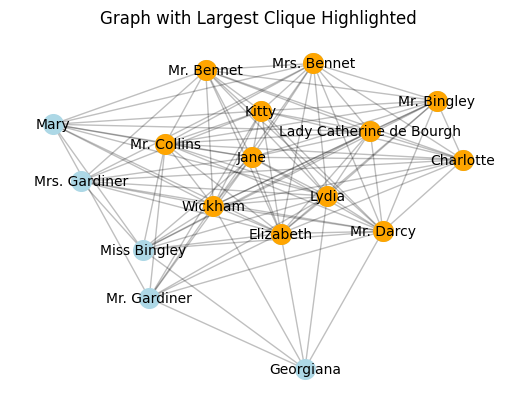

In [ ]:
#clique analysis - Pride & Prejudice

cliques = list(nx.find_cliques(G)) #check that G is always for PnP and never for SnS
largest_clique = max(cliques, key=len)

print("All cliques:", cliques)
print("Largest clique:", largest_clique)

# Graph drawing
pos = nx.spring_layout(G)  # positions for all nodes

# Draw all nodes and edges
nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=200)
nx.draw_networkx_edges(G, pos, alpha=0.25)

# Highlight the nodes in the largest clique
nx.draw_networkx_nodes(G, pos, nodelist=largest_clique, node_color='orange', node_size=200)

# Labels for the nodes
nx.draw_networkx_labels(G, pos, font_size=10, font_family='sans-serif')

plt.title('Graph with Largest Clique Highlighted')
plt.axis('off')  # Turn off the axis
plt.show()

#https://medium.com/@abdibrokhim/how-to-find-largest-clique-using-networkx-in-python-174e62ac177b

Here we see that most of the characters are all in one large clique together. Lizzy and Jane, the Bennet Parents, Lydia, Charlotte, Mr. Collins, Lady Catherine, Darcy and Wickham are all in one clique. Meanwhile, the Gardiners, Miss Bingley, Mary, Kitty, and Gergiana are in a second clique. This split highlights core characters vs side characters, with the main characters in orange.

The novel revolves around Jane and Lizzy, with Lydia's antics gaining her a coveted spot in the inner circle. The younger Bennet sister, Mary remains on the periphery. While it may not be surprising that a character with such little on-page time as Georgiana is a side character, it is more surprising that Miss Bingley is, especially given her association with Jane and her antagonism at the beginning of the story. Perhaps this highlights that after Jane is engaged, they fade into the background. Marriage is the goal of this book. It also shows that while Caroline gets a lot of page-time, she does not openly associate with many other characters; her orbit of influence is small.

All cliques: [['Elinor Dashwood', 'Robert Ferrars', 'Lucy Steele', 'Fanny Dashwood', 'Edward Ferrars', 'Mrs. Ferrars', 'John Dashwood'], ['Elinor Dashwood', 'Miss Sophia Grey', 'John Willoughby'], ['Elinor Dashwood', 'Marianne Dashwood', 'Mrs. Jennings', 'Lady Middleton', 'Colonel Brandon', 'Margaret Dashwood', 'Mrs. Dashwood', 'Sir John Middleton', 'Mr. Thomas Palmer'], ['Elinor Dashwood', 'Marianne Dashwood', 'Mrs. Jennings', 'Lady Middleton', 'Colonel Brandon', 'Margaret Dashwood', 'Mrs. Dashwood', 'Sir John Middleton', 'John Willoughby'], ['Elinor Dashwood', 'Marianne Dashwood', 'Mrs. Jennings', 'Lady Middleton', 'Colonel Brandon', 'Lucy Steele', 'Edward Ferrars', 'Mrs. Dashwood', 'Sir John Middleton', 'Mr. Thomas Palmer'], ['Elinor Dashwood', 'Marianne Dashwood', 'Mrs. Jennings', 'Lady Middleton', 'Colonel Brandon', 'Lucy Steele', 'Edward Ferrars', 'Mrs. Dashwood', 'Sir John Middleton', 'John Willoughby'], ['Elinor Dashwood', 'Marianne Dashwood', 'Mrs. Jennings', 'Lady Middleton',

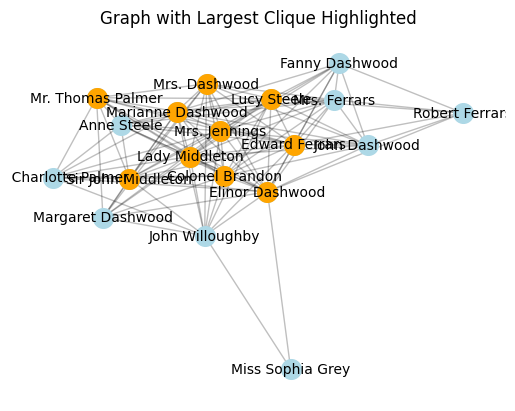

In [ ]:
#Cliques - Sense & Sensibility
cliques = list(nx.find_cliques(G_s))
largest_clique = max(cliques, key=len)

print("All cliques:", cliques)
print("Largest clique:", largest_clique)

# Graph drawing
pos = nx.spring_layout(G_s)  # positions for all nodes

# Draw all nodes and edges
nx.draw_networkx_nodes(G_s, pos, node_color='lightblue', node_size=200)
nx.draw_networkx_edges(G_s, pos, alpha=0.25)

# Highlight the nodes in the largest clique
nx.draw_networkx_nodes(G_s, pos, nodelist=largest_clique, node_color='orange', node_size=200)

# Labels for the nodes
nx.draw_networkx_labels(G_s, pos, font_size=10, font_family='sans-serif')

plt.title('Graph with Largest Clique Highlighted')
plt.axis('off')  # Turn off the axis
plt.show()

Here, the two cliques are a little less straightfoward with the Dahswood sisters being split into different cliques, and also not necessarily in the same clique as their romantic interests. This could be due to the Dashwoods moving around to different locations within the book - character cliques would thus be geographically motivated. This however cannot be the whole story as that would not explain why Fanny  and John are in a different clique than Elinor. Perhaps this shows a lack of focus on the love stories in the novel, or reflects the difference in age between the Dashwood family members. It could also reflect the competing plot lines and indicate a round-about way to conflict resolution with the two competing storylines intersecting and influencing each other in a complementary or supplementary way.

All cliques: [['Emma Woodhouse', 'Miss Hawkins', 'Mr. Elton', 'Mrs. Elton', 'Miss Bates'], ['Emma Woodhouse', 'Miss Hawkins', 'Mr. Elton', 'Mr. Cole'], ['Emma Woodhouse', 'Mr. Cole', 'Jane Fairfax', 'Frank Churchill', 'Mr. Elton', 'George Knightley'], ['Emma Woodhouse', 'Mr. Cole', 'Jane Fairfax', 'Frank Churchill', 'Mrs. Cole'], ['Emma Woodhouse', 'Mrs. Bates', 'Mr. Weston', 'Mrs. Elton', 'Frank Churchill', 'Jane Fairfax'], ['Emma Woodhouse', 'Mrs. Bates', 'Mr. Weston', 'Mrs. Goddard'], ['Emma Woodhouse', 'Mrs. Bates', 'Miss Bates', 'Mrs. Elton', 'Frank Churchill', 'Jane Fairfax'], ['Emma Woodhouse', 'Mrs. Bates', 'Miss Bates', 'Mrs. Goddard'], ['Emma Woodhouse', 'Elizabeth Martin', 'Mrs. Goddard'], ['Emma Woodhouse', 'Harriet Smith', 'Robert Martin', 'Mrs. Goddard', 'Mr. Weston', 'Mr. Elton', 'George Knightley'], ['Emma Woodhouse', 'Harriet Smith', 'Robert Martin', 'Mrs. Goddard', 'Mrs. Martin'], ['Emma Woodhouse', 'Harriet Smith', 'Robert Martin', 'Isabella Knightley'], ['Emma Woodh

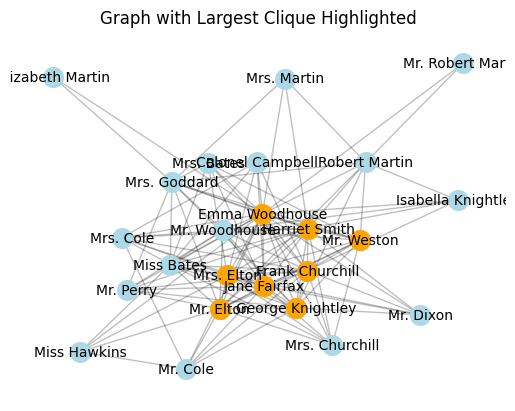

In [ ]:
#clique analysis - Emma

cliques = list(nx.find_cliques(G_e))
largest_clique = max(cliques, key=len)

print("All cliques:", cliques)
print("Largest clique:", largest_clique)

# Graph drawing
pos = nx.spring_layout(G_e)  # positions for all nodes

# Draw all nodes and edges
nx.draw_networkx_nodes(G_e, pos, node_color='lightblue', node_size=200)
nx.draw_networkx_edges(G_e, pos, alpha=0.25)

# Highlight the nodes in the largest clique
nx.draw_networkx_nodes(G_e, pos, nodelist=largest_clique, node_color='orange', node_size=200)

# Labels for the nodes
nx.draw_networkx_labels(G_e, pos, font_size=10, font_family='sans-serif')

plt.title('Graph with Largest Clique Highlighted')
plt.axis('off')  # Turn off the axis
plt.show()

The two cliques in *Emma* are fairly straightfoward with the main characters in orange and the secondary characters in blue. What may be surprising is the number of secondary characters when compared to main characters. Also, it may be surprising the Jane is in the same clique as Emma, despite Emma actively avoiding this the whole novel. This speaks to Jane's prominence in Emma's narrative, despite the nature of their actual relationship.

Previously, we've seen that the networks are all highly decentralized; most characters know each other and interact with each other. With the exception of *Emma*, we don't see many strong cliques or groups forming. Another way to look at the networks is to dichotemize them based on the number of ties. This will show level by level which characters are most connected, and to whom. This could display interesting patterns that were hidden by the sheer number of ties prevously.

For the *Pride & Prejudice* network, I did 5 levels: more than 4 ties, more than 8 ties, and more than 12 ties, more than 16 ties, and more than 20 ties. All characters in the novel have more than 4 ties. Georgiana has the fewest with 6, but this version also takes into account the weight of the tie, which removes some of the edges, even at the 4 ties level.

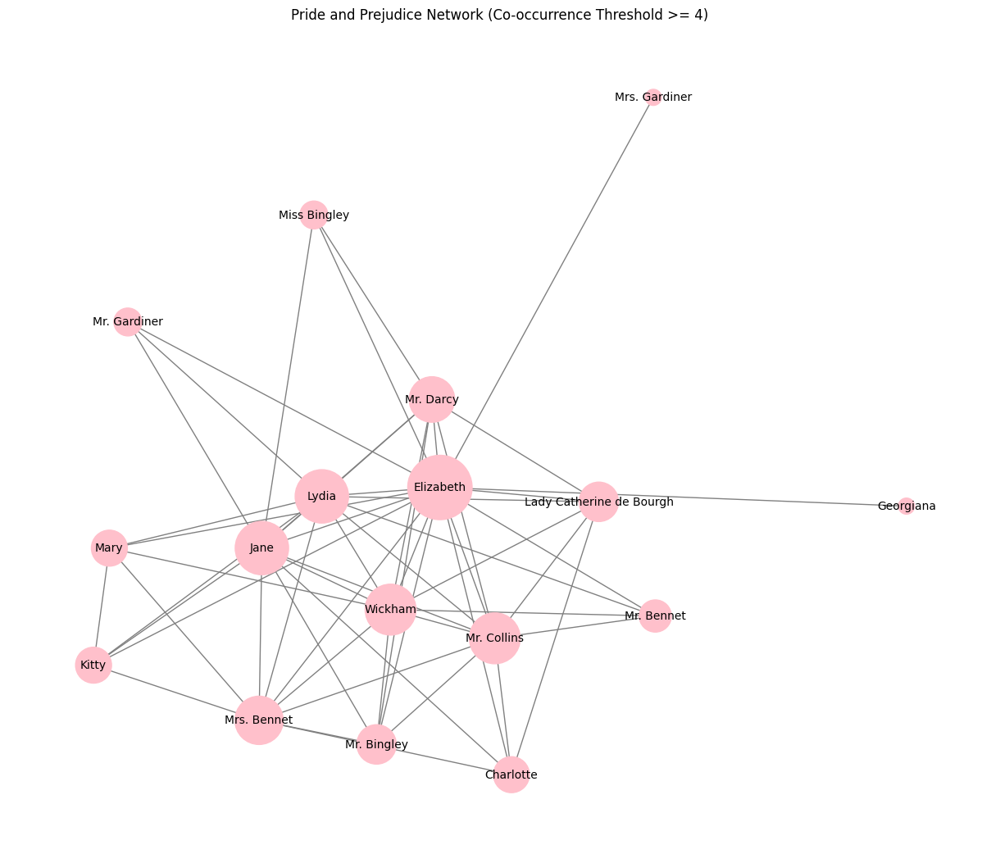

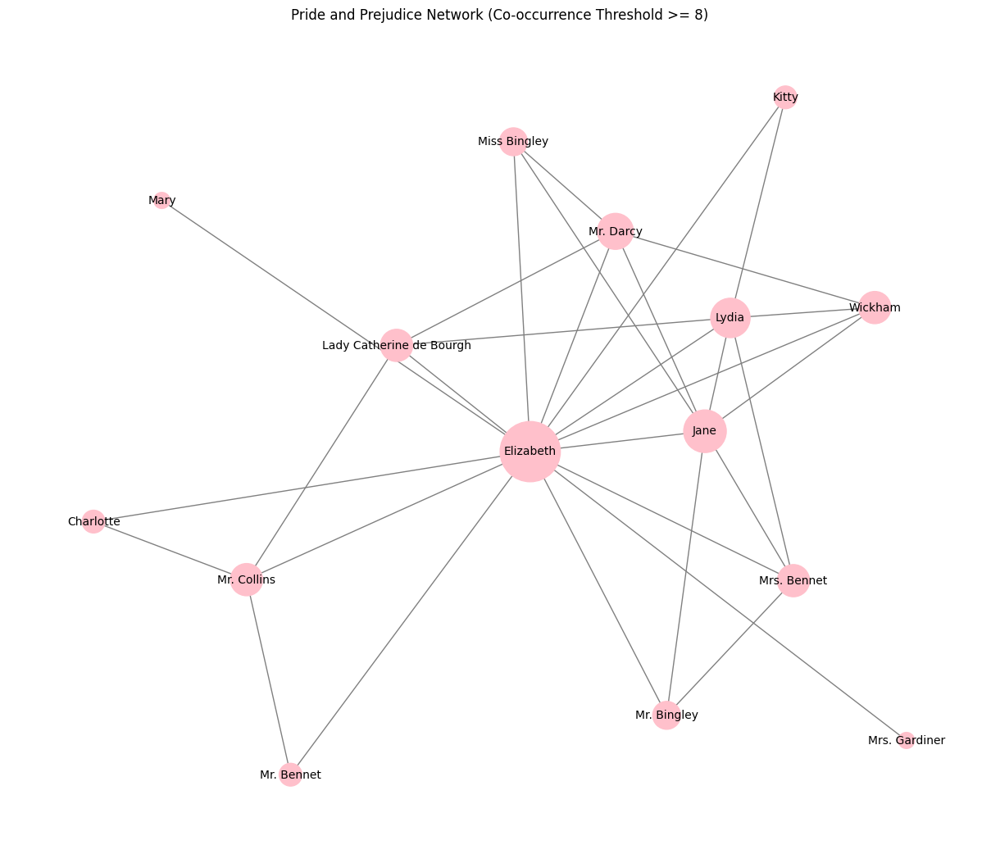

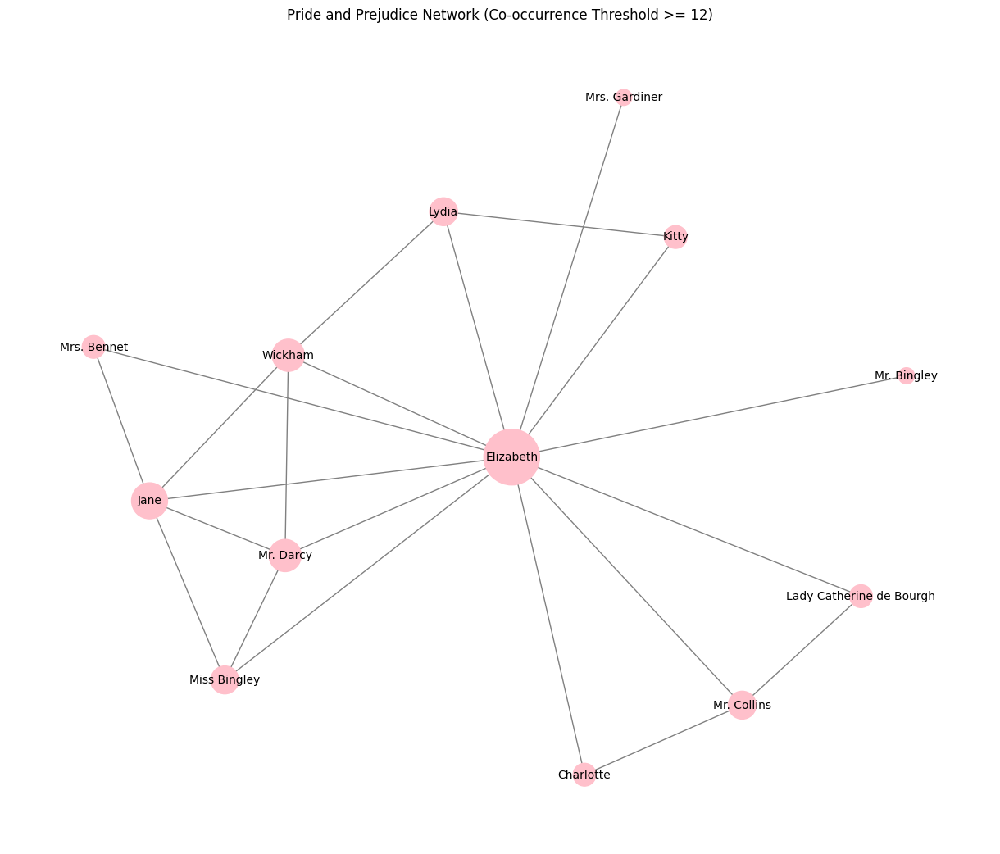

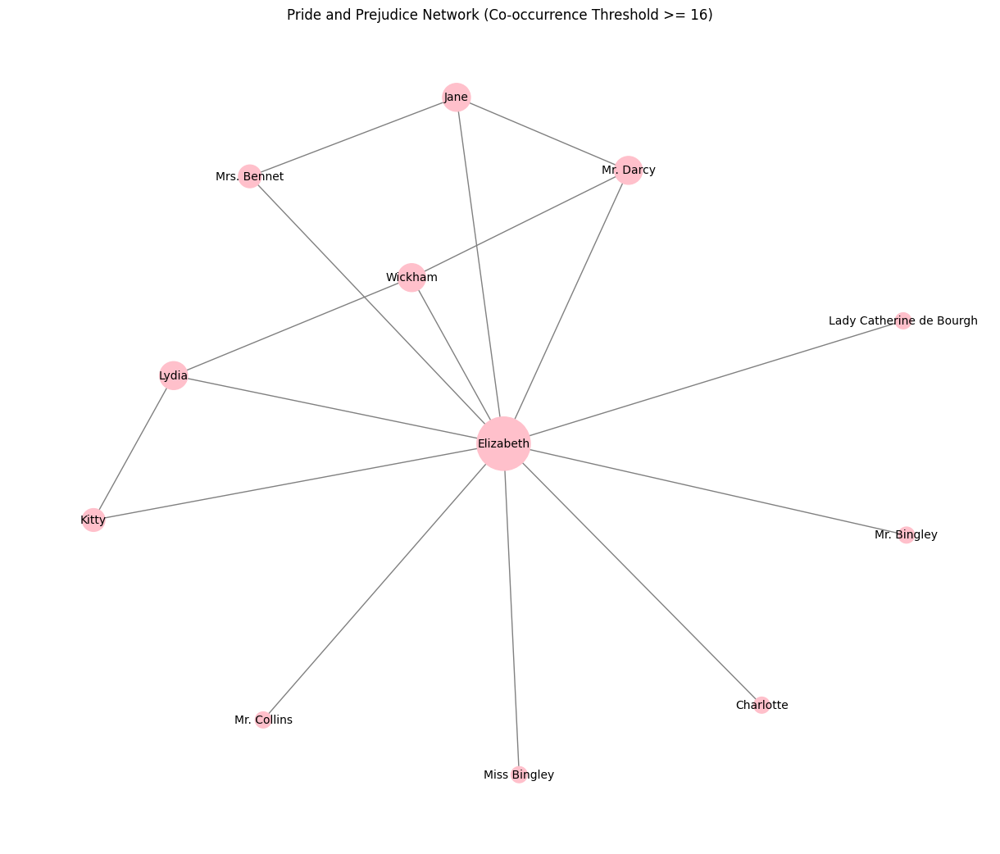

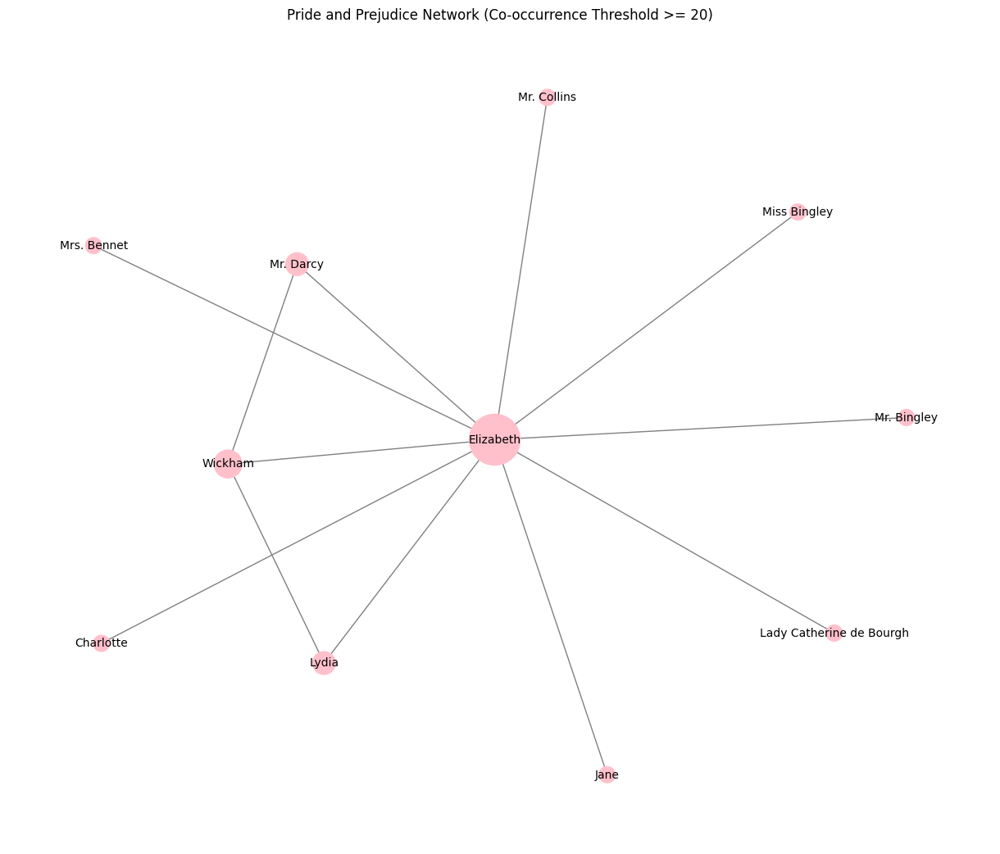

In [ ]:
#Dichotomized network - weight of ties

# The base unweighted network is created outside the loop if not filtering by weight
# However, since we are now filtering by co-occurrence count, we need to re-create
# the graph within the loop for each threshold 'i'.

for i in [4, 8, 12, 16, 20]: # Using the specified values for thresholds
    # Filter the co-occurrence DataFrame based on the current threshold 'i'
    filtered_df = character_co_occurrence_df[character_co_occurrence_df['Co-occurrence Count'] >= i]

    # Create a new graph for each threshold
    G_thresholded = nx.from_pandas_edgelist(filtered_df,
                                'Character 1',
                                'Character 2',
                                edge_attr='Co-occurrence Count')

    # Calculate the degree of each node in the thresholded graph
    degrees = [G_thresholded.degree(node) for node in G_thresholded.nodes()]
    # Scale node sizes based on degree for better visualization
    scaled_node_sizes = [d * 200 for d in degrees]

    plt.figure(figsize=(12, 10))
    # Generate layout for the current thresholded graph
    pos = nx.spring_layout(G_thresholded, k=0.5, iterations=50)

    nx.draw(G_thresholded, pos, with_labels=True, node_color='pink', node_size=scaled_node_sizes,
            edge_color='gray', linewidths=1, font_size=10)
    plt.title(f"Pride and Prejudice Network (Co-occurrence Threshold >= {i})")
    plt.show()

In the more than 4 ties, we see very quickly that secondary characters like Georgiana and Mr. Gardiner are only connected to Lizzy, and much of the noise of the network has fallen away. Then, Lizzy becomes the focul point of the network with most of the characters being connected only to her. By the final network (n >= 20), only Lydia, Wickham, and Darcy are connected to each other, with everyone else solely being connected to Lizzy. What's also interesting is which characters remain in the final graph. Lizzy is connected to her love interest: Darcy, Wickham, and Collins, her rivals and nemesises Lady Catherine and Miss Bingley, her BFF Charlotte, and only two of her sisters (Jane & Lydia), as well as Jane's love interest Mr. Bingley. This is a majority of the characters, and it also highlights the most important relationships in the novel, proving that Lizzy is in fact, the center of the story.

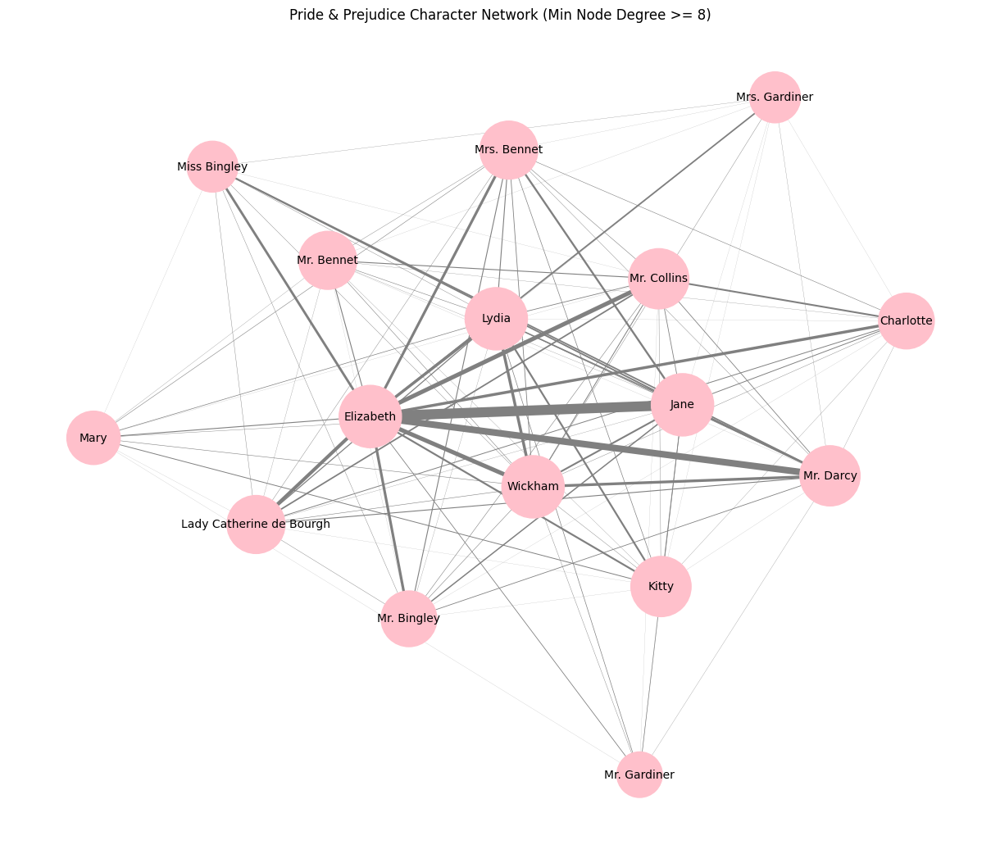

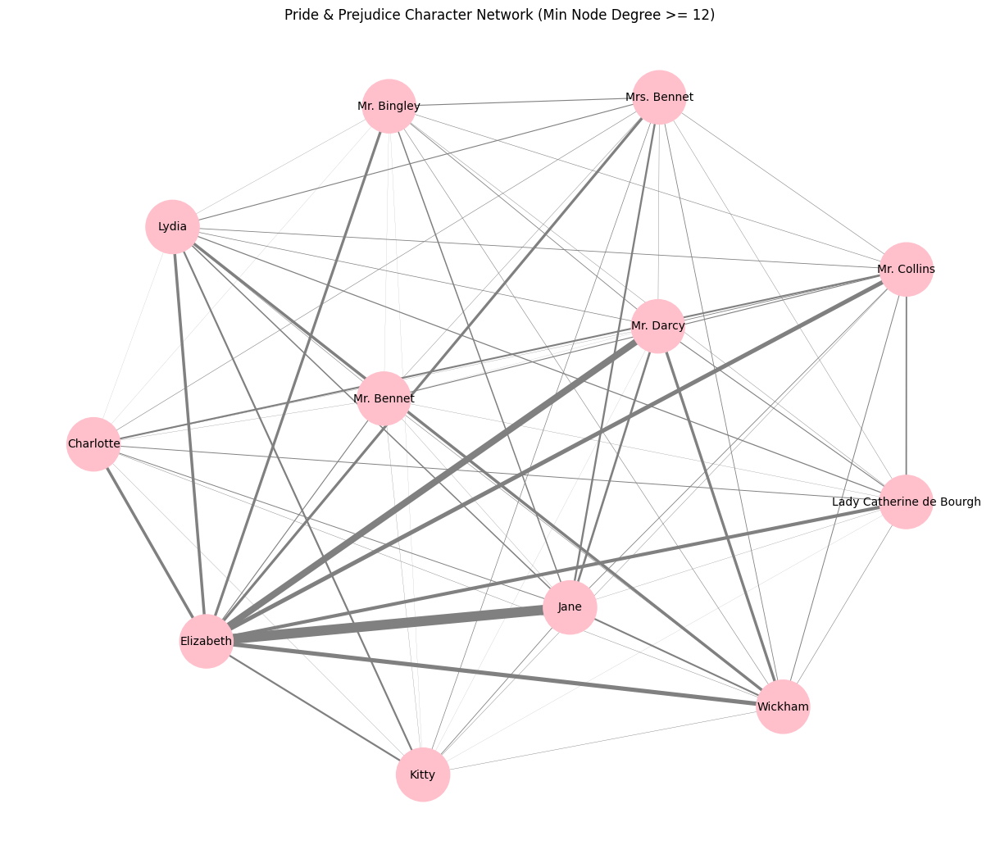

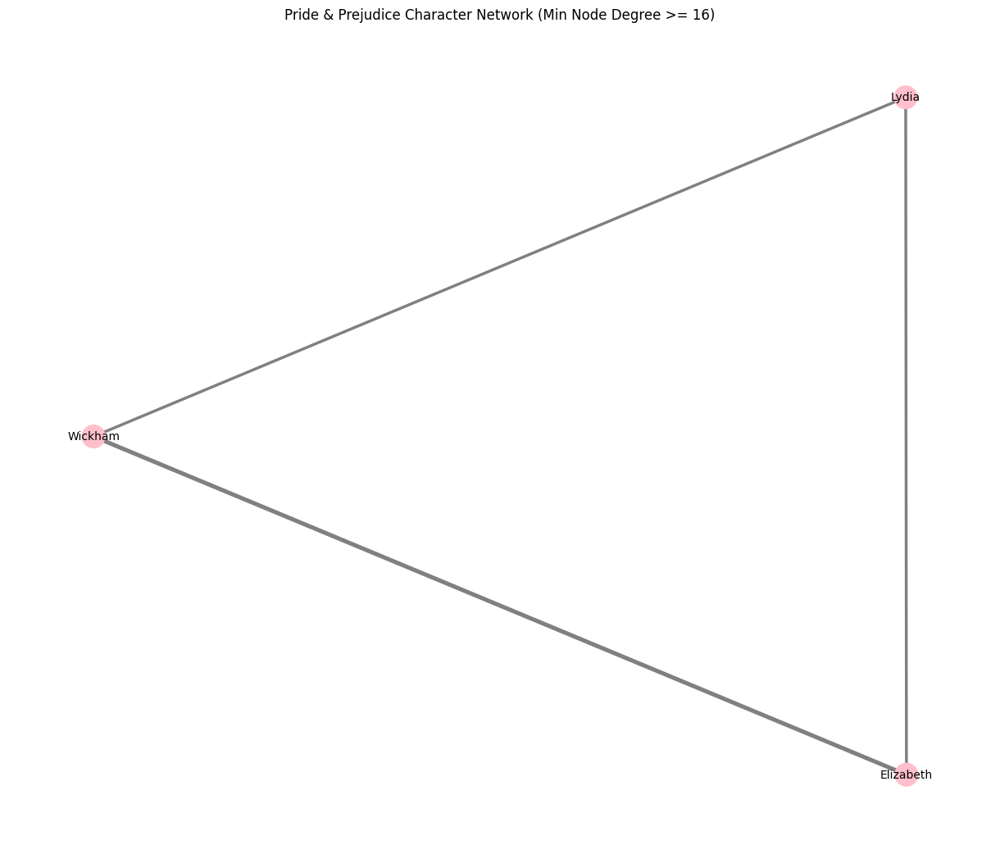

In [ ]:
#Dichotomized network - filter by node degree (number of connections)

# First, create the full graph to calculate degrees of all nodes
G_full = nx.from_pandas_edgelist(character_co_occurrence_df,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')
degrees_full = dict(G_full.degree())

for i in [8, 12, 16]: # Using the specified values for degree thresholds
    # Identify nodes that have a degree greater than or equal to 'i'
    nodes_above_threshold = {node for node, degree in degrees_full.items() if degree >= i}

    # Filter the co-occurrence DataFrame to keep only edges where both characters are above the degree threshold
    filtered_df = character_co_occurrence_df[
        (character_co_occurrence_df['Character 1'].isin(nodes_above_threshold)) &
        (character_co_occurrence_df['Character 2'].isin(nodes_above_threshold))
    ]

    # Create a new graph from the degree-filtered DataFrame
    G_thresholded = nx.from_pandas_edgelist(filtered_df,
                                'Character 1',
                                'Character 2',
                                edge_attr='Co-occurrence Count')

    # Calculate the degree of each node in the *newly created* thresholded graph
    # This degree will reflect connections *only within* the thresholded network.
    current_degrees = [G_thresholded.degree(node) for node in G_thresholded.nodes()]
    # Scale node sizes based on degree for better visualization
    scaled_node_sizes = [d * 200 for d in current_degrees]

    # Get the edge weights for the thresholded graph
    weights = [G_thresholded[u][v]['Co-occurrence Count'] for u, v in G_thresholded.edges()]
    scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

    plt.figure(figsize=(12, 10))
    # Generate layout for the current thresholded graph
    pos = nx.spring_layout(G_thresholded, k=0.5, iterations=50)

    nx.draw(G_thresholded, pos, with_labels=True, node_color='pink', node_size=scaled_node_sizes,
            edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)
    plt.title(f"Pride & Prejudice Character Network (Min Node Degree >= {i})")
    plt.show()

This second version filters only by degree, so number of connections, and not the weight of those connects. This is why it has so many more characters still in the network at n > 8; since most of the characters are well connected. However, those nodes very quickly fall away. The final n > 20 version has only 3 characters: Elizabeth, Wickham, and Lydia. This network shows almost an A and a B story with one focus of the story being the scandal of Lydia and Wickham's elopment, which is the core story, and then the frame of Lizzy's interactions with Darcy, the other Bennett girls, Lady Catherine, and Mr. Collins. In this view of the novel, the early tensions with Miss Bingley and Jane do not even come into focus and merely serve as set up for the eventual key storyline of Lydia and Wickham. This is somewhat of an interesting way of thinking about the novel. Perhaps it speaks to it not being interesting to read about when things go well, as they do with Jane and Bingley, but that the drama of the scandal is more interesting, which is why it gets so much more on-page time.

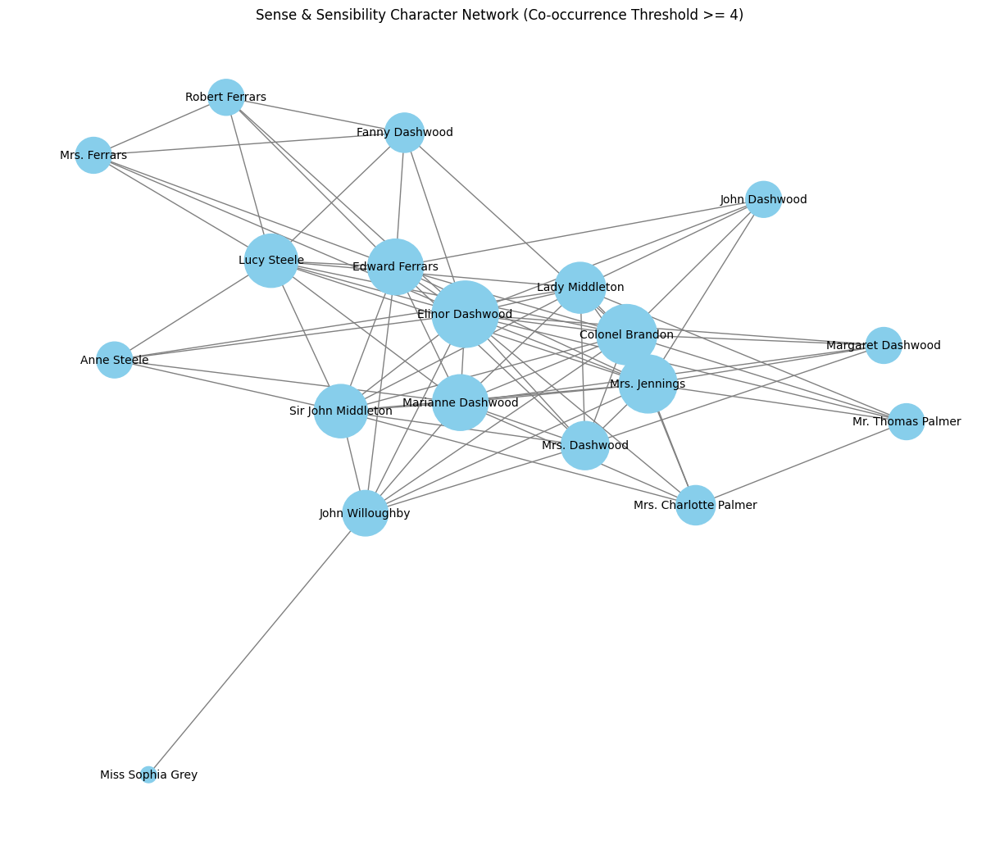

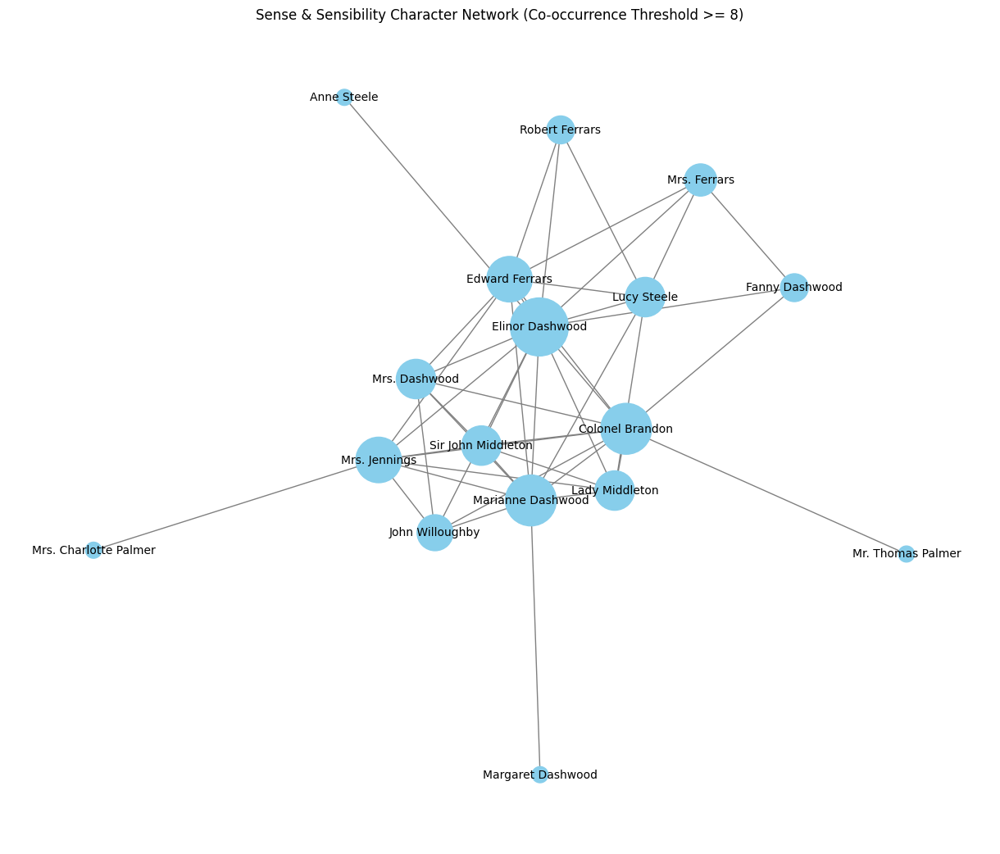

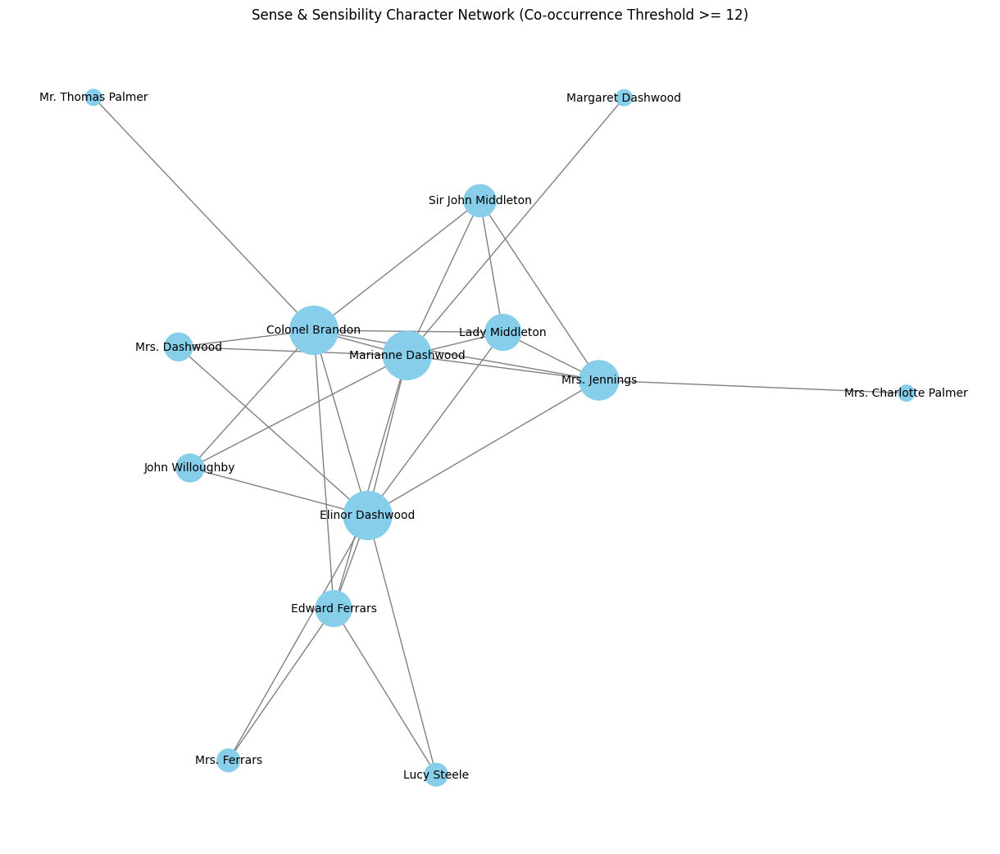

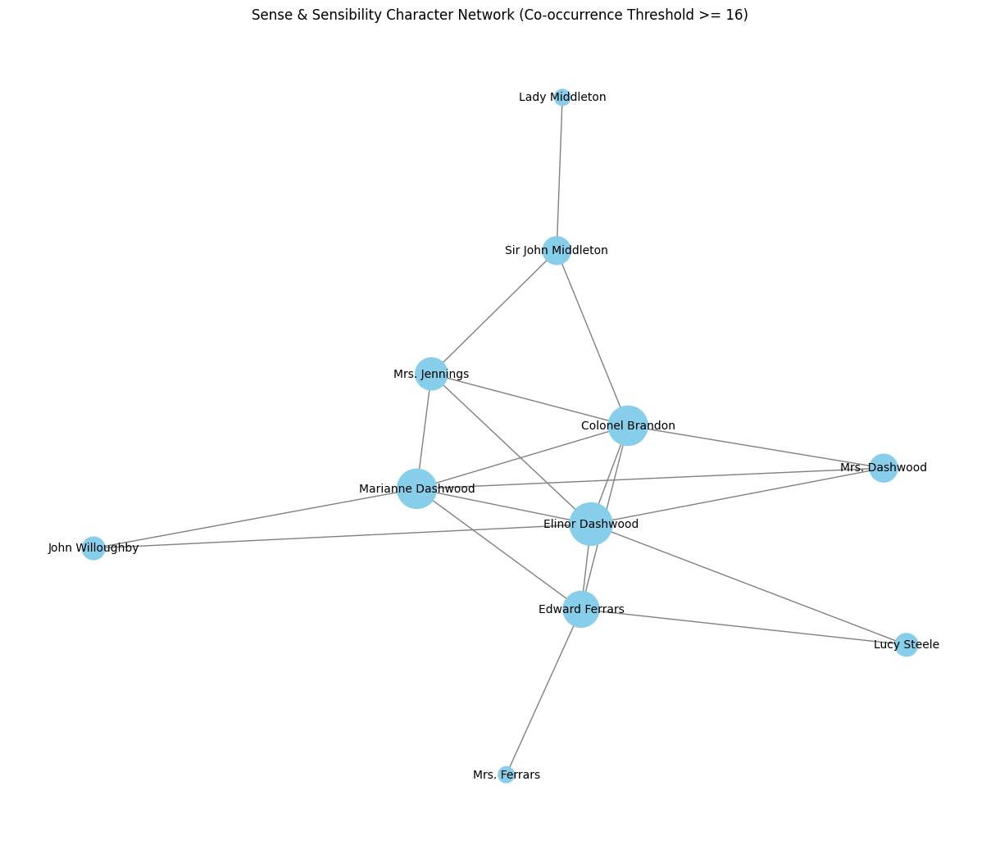

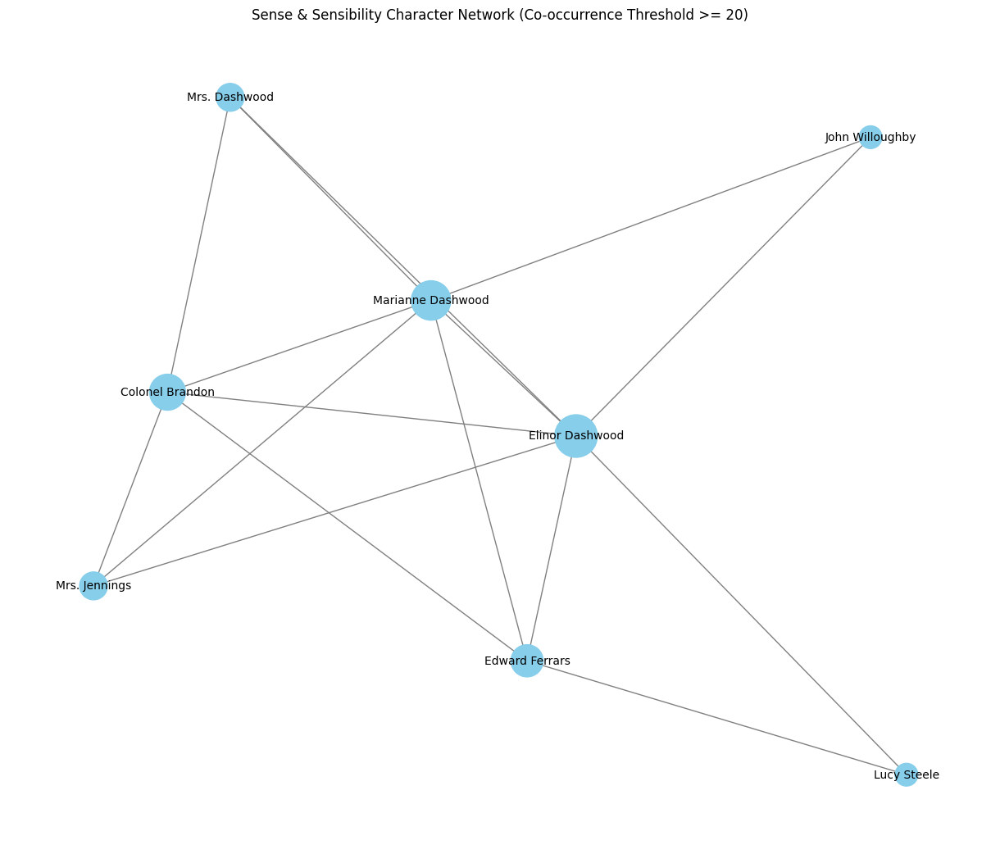

In [ ]:
#Dichotomized network - weight of ties

# The base unweighted network is created outside the loop if not filtering by weight
# However, since we are now filtering by co-occurrence count, we need to re-create
# the graph within the loop for each threshold 'i'.

for i in [4, 8, 12, 16, 20]: # Using the specified values for thresholds
    # Filter the co-occurrence DataFrame based on the current threshold 'i'
    filtered_df = character_co_occurrence_df_s[character_co_occurrence_df_s['Co-occurrence Count'] >= i]

    # Create a new graph for each threshold
    G_s_thresholded = nx.from_pandas_edgelist(filtered_df,
                                'Character 1',
                                'Character 2',
                                edge_attr='Co-occurrence Count')

    # Calculate the degree of each node in the thresholded graph
    degrees = [G_s_thresholded.degree(node) for node in G_s_thresholded.nodes()]
    # Scale node sizes based on degree for better visualization
    scaled_node_sizes = [d * 200 for d in degrees]

    plt.figure(figsize=(12, 10))
    # Generate layout for the current thresholded graph
    pos = nx.spring_layout(G_s_thresholded, k=0.5, iterations=50)

    nx.draw(G_s_thresholded, pos, with_labels=True, node_color='skyblue', node_size=scaled_node_sizes,
            edge_color='gray', linewidths=1, font_size=10)
    plt.title(f"Sense & Sensibility Character Network (Co-occurrence Threshold >= {i})")
    plt.show()

Repeating the process with *Sense & Sensibility* shows a similar pattern. In the first two versions of the network, the secondary characters, such as Sophia Gray and Anne Steel, are easily identifiable from their singular connections and quick exit from the network. However, the final (n > 20) connections version of the network is larger than the one from *Pride & Prejudice*, including Marianne and Elinor Dashwood, their love interests Colonel Brandon,  Edward Farras and John Willoughby, and the antagonist Lucy Steel. Unlike *Pride & Prejudice*, *Sense & Sensibility* is firmly grounded in the main love stories of Marianne and Elinor. The presence of both couples in the final network indicates that the novel presents both of these romances equally, not really allowing one sister's story to dominate the other's.  

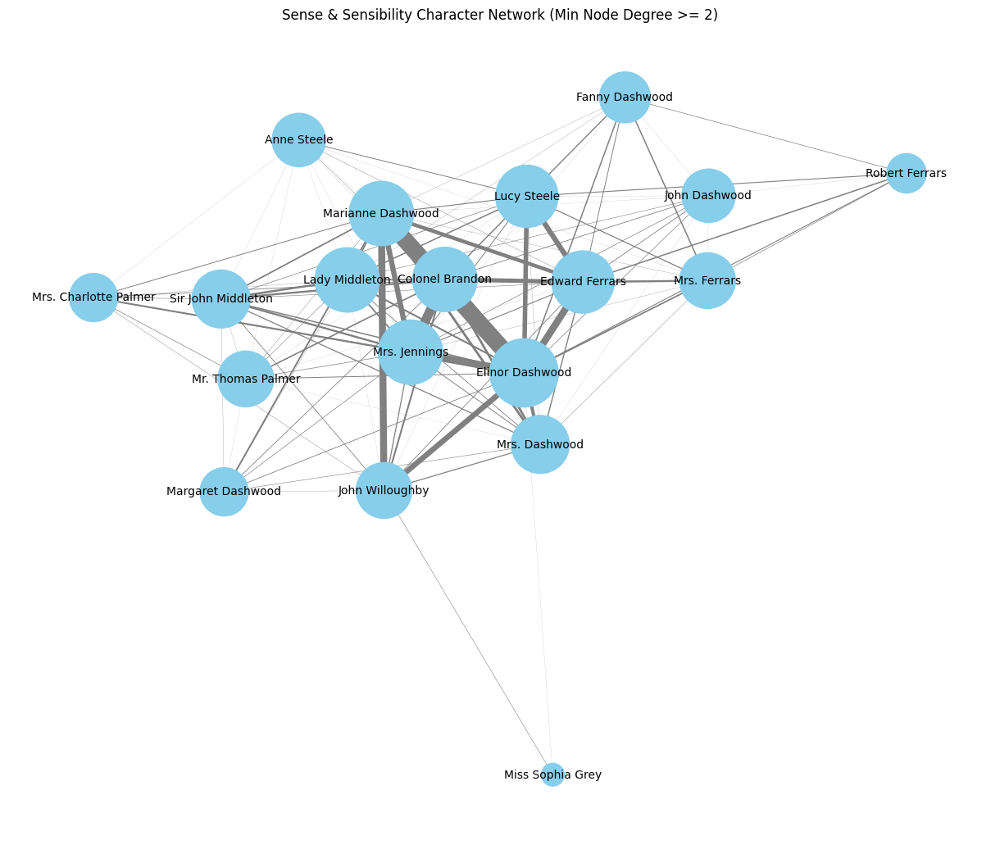

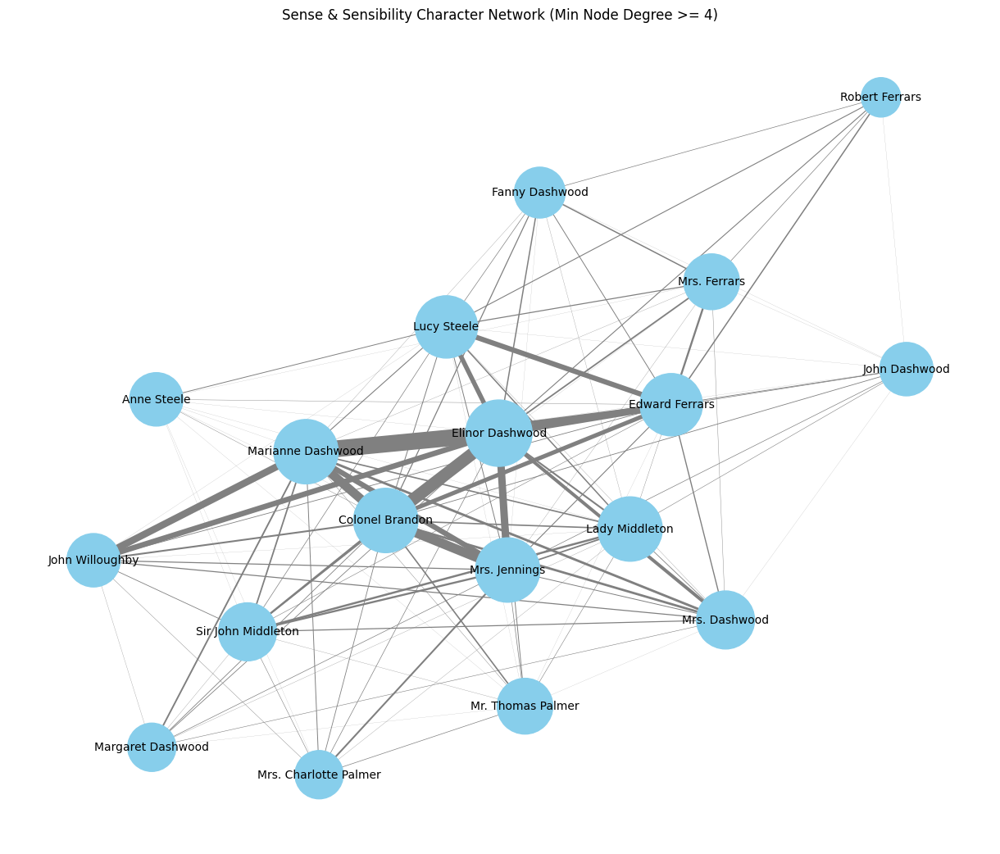

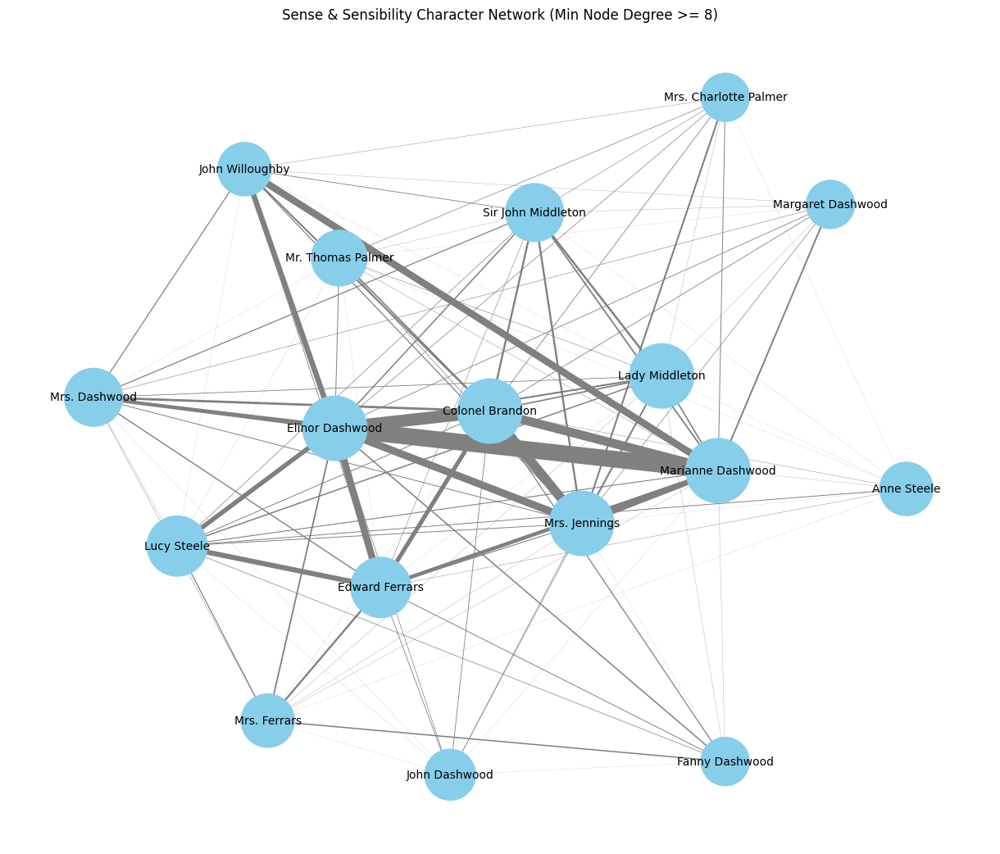

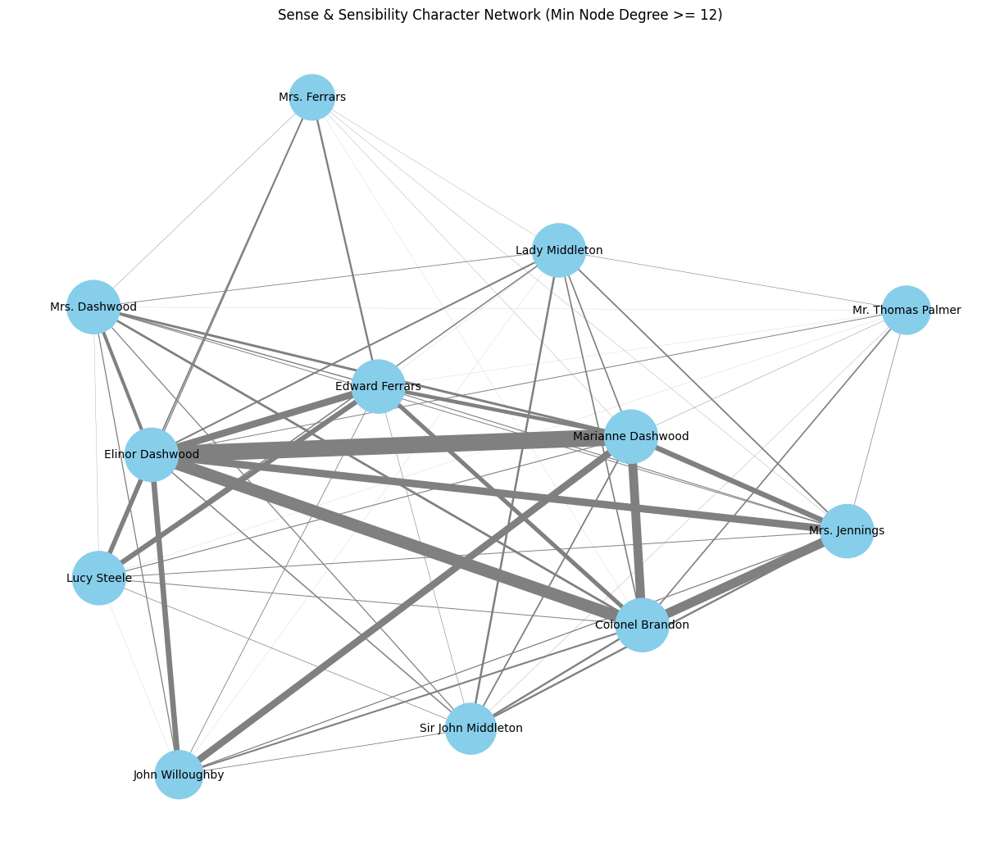

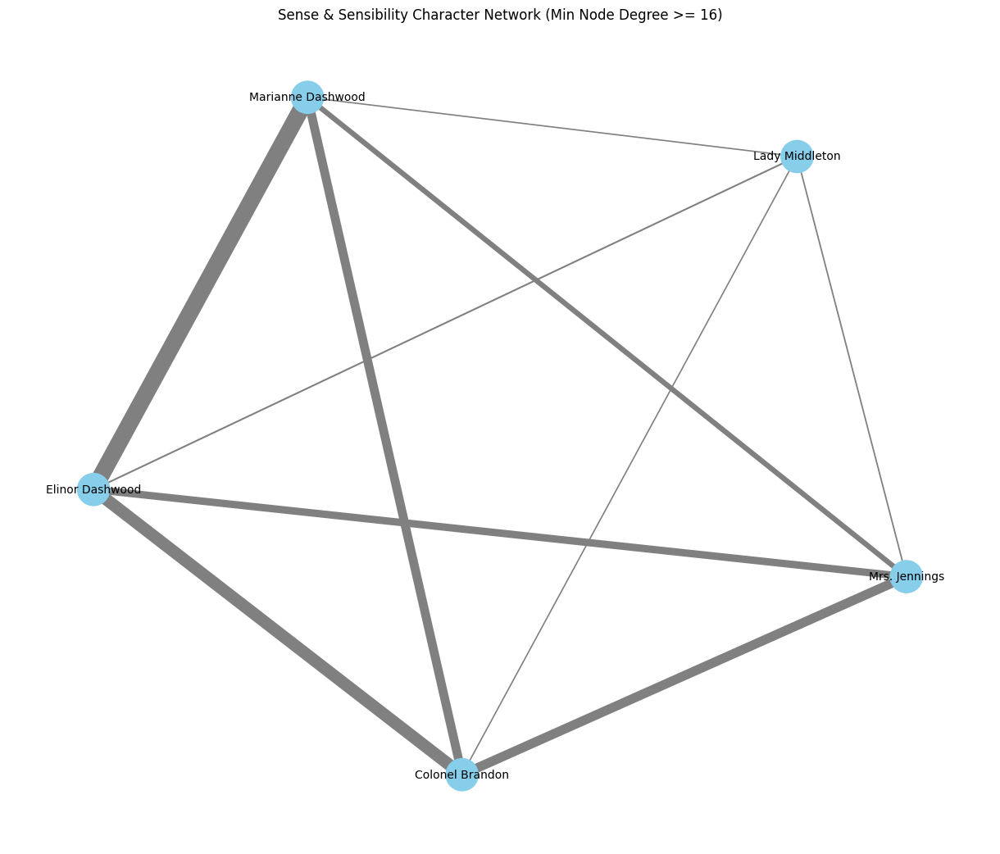

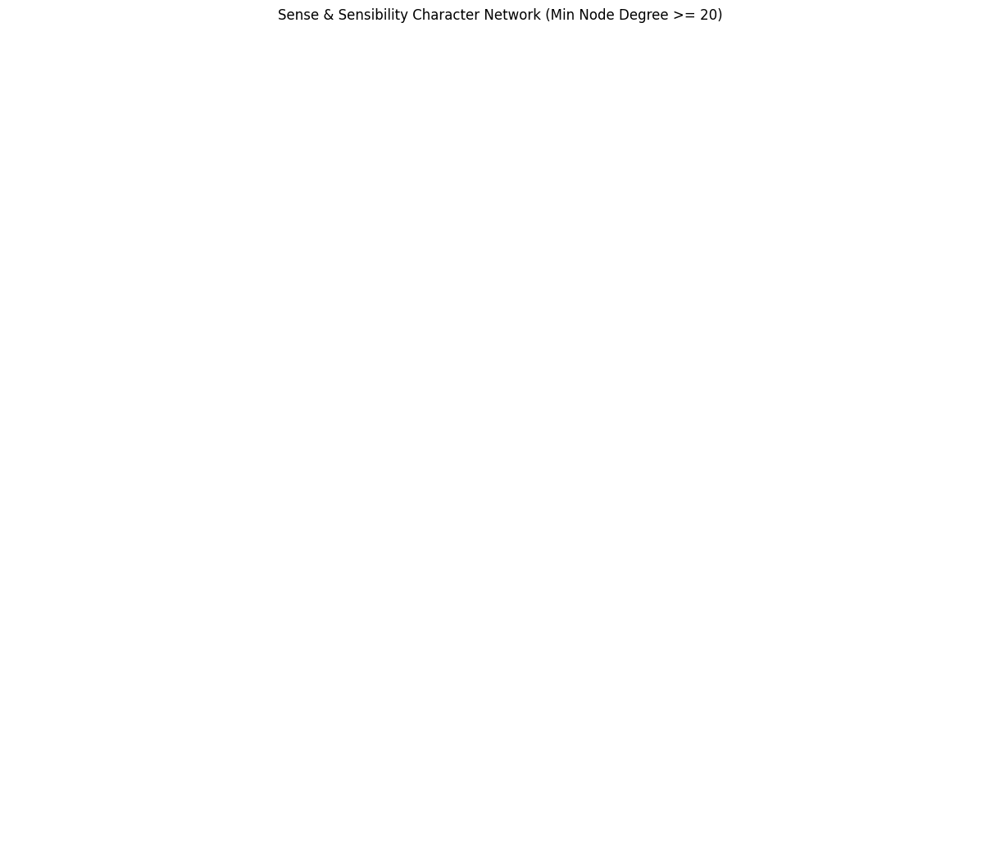

In [ ]:
#Dichotomized network - filter by node degree (number of connections)

# First, create the full graph to calculate degrees of all nodes
G_full = nx.from_pandas_edgelist(character_co_occurrence_df_s,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')
degrees_full = dict(G_full.degree())

for i in [2, 4, 8, 12, 16, 20]: # Using the specified values for degree thresholds
    # Identify nodes that have a degree greater than or equal to 'i'
    nodes_above_threshold = {node for node, degree in degrees_full.items() if degree >= i}

    # Filter the co-occurrence DataFrame to keep only edges where both characters are above the degree threshold
    filtered_df = character_co_occurrence_df_s[
        (character_co_occurrence_df_s['Character 1'].isin(nodes_above_threshold)) &
        (character_co_occurrence_df_s['Character 2'].isin(nodes_above_threshold))
    ]

    # Create a new graph from the degree-filtered DataFrame
    G_s_thresholded = nx.from_pandas_edgelist(filtered_df,
                                'Character 1',
                                'Character 2',
                                edge_attr='Co-occurrence Count')

    # Calculate the degree of each node in the *newly created* thresholded graph
    # This degree will reflect connections *only within* the thresholded network.
    current_degrees = [G_s_thresholded.degree(node) for node in G_s_thresholded.nodes()]
    # Scale node sizes based on degree for better visualization
    scaled_node_sizes = [d * 200 for d in current_degrees]

    # Get the edge weights for the thresholded graph
    weights = [G_s_thresholded[u][v]['Co-occurrence Count'] for u, v in G_s_thresholded.edges()]
    scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

    plt.figure(figsize=(12, 10))
    # Generate layout for the current thresholded graph
    pos = nx.spring_layout(G_s_thresholded, k=0.5, iterations=50)

    nx.draw(G_s_thresholded, pos, with_labels=True, node_color='skyblue', node_size=scaled_node_sizes,
            edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)
    plt.title(f"Sense & Sensibility Character Network (Min Node Degree >= {i})")
    plt.show()

This version of the dichotemized network tells a similar story. However, notably, there is no n > 20 network in this version. The n > 16 version is slightly more robust with 5 characters represented: Elinor, Marianne, Colonel Brandon, Mrs. Jennings, Lady Middleton. Edward Ferraras' exit from the network may indcate that the previous hypothesis of both sisters holding equal impact on the novel is untrue: Marianne dominates the story, but only slightly. What is interesting is the inclusion of Mrs. Jennings and her daughter Lady Middleton. While from an analysis persepctive it may be possible to consider them secondary characters, they clearly hold a great deal of prominance in the novel to appear in the n > 20 version of the network.

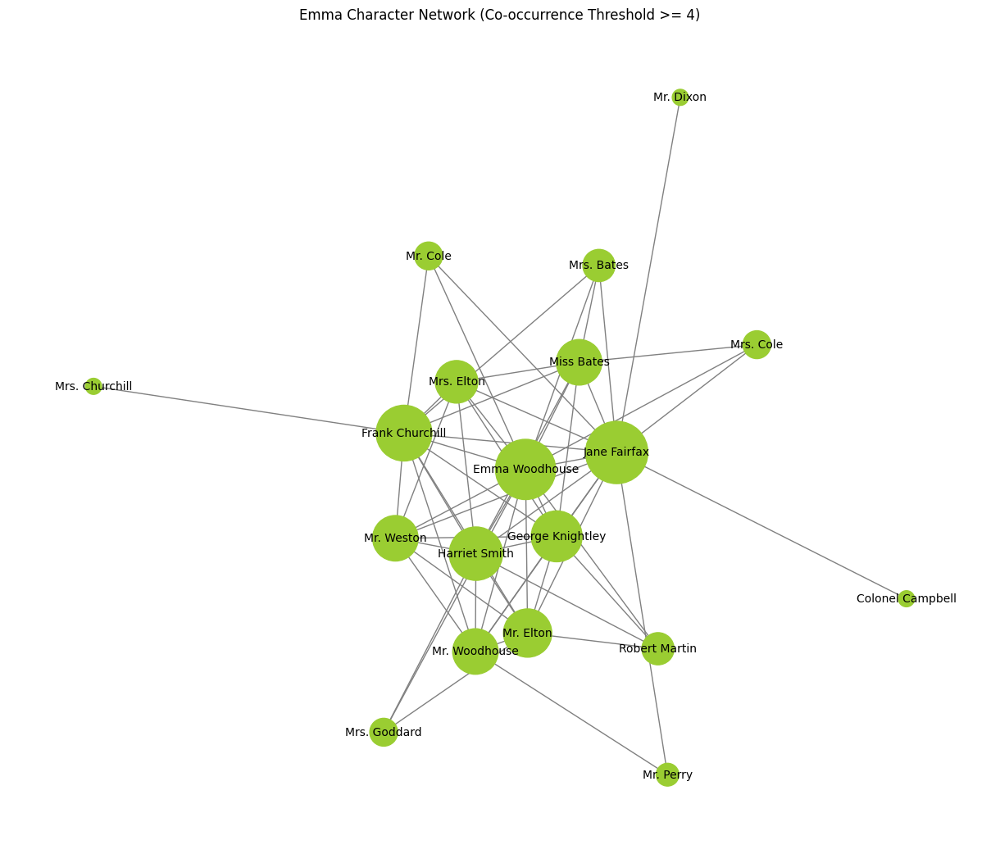

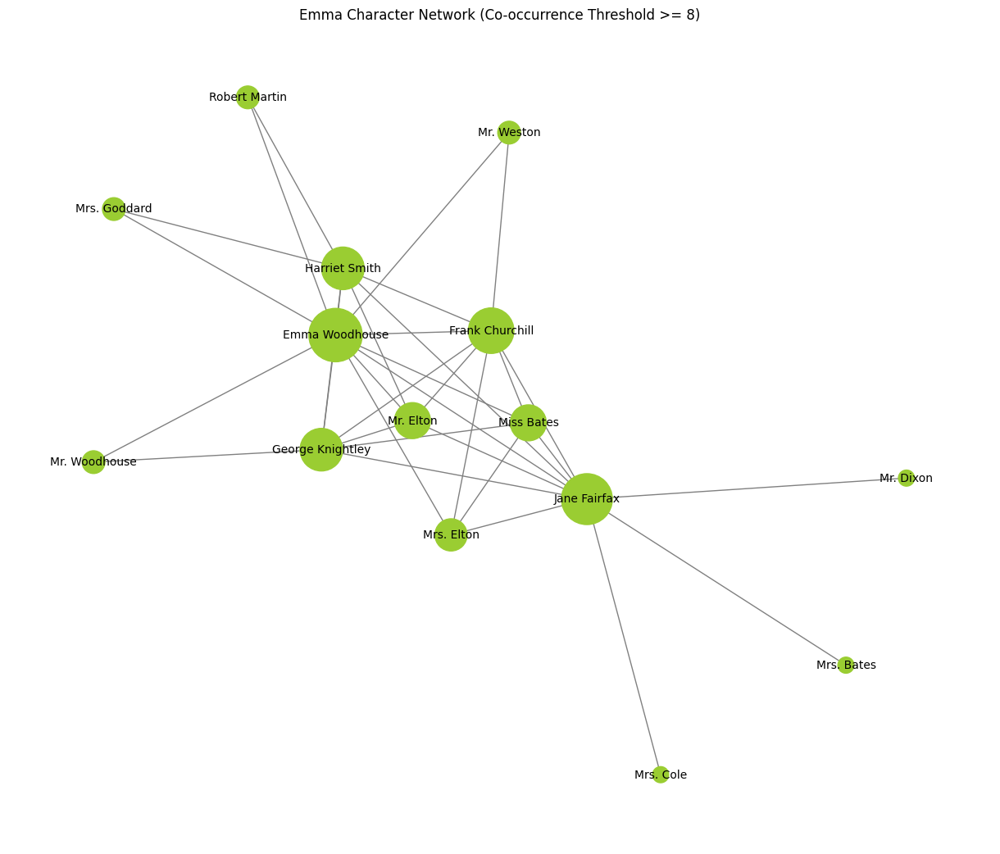

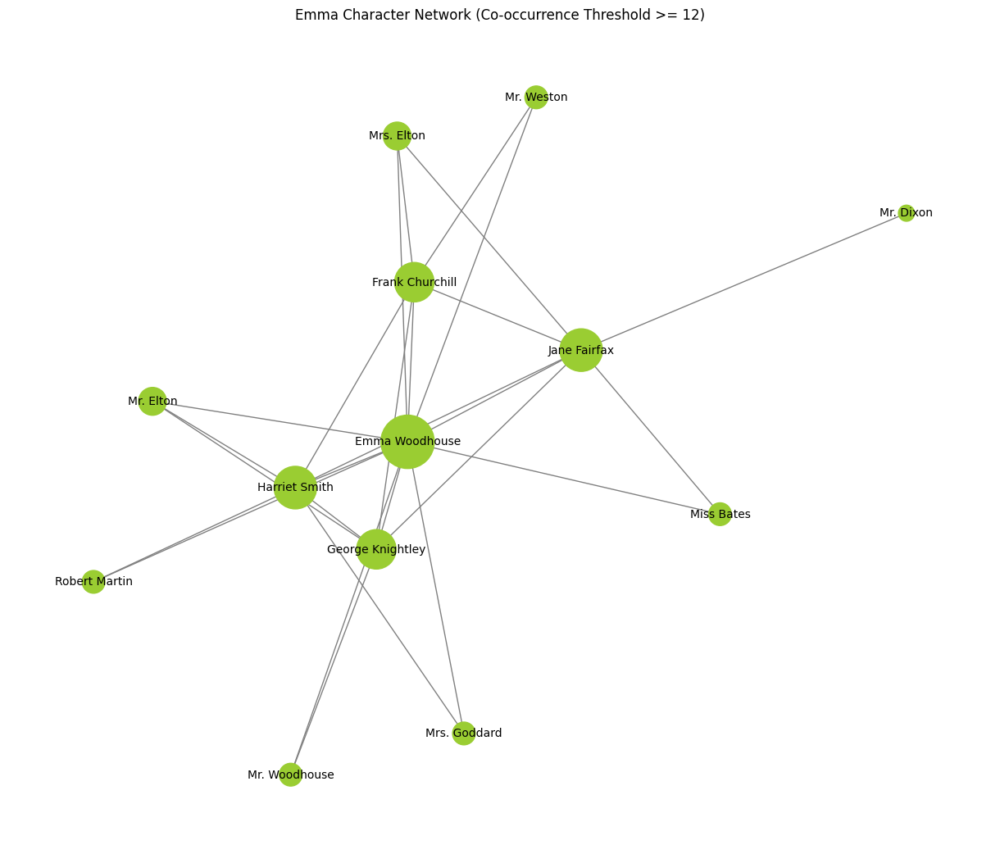

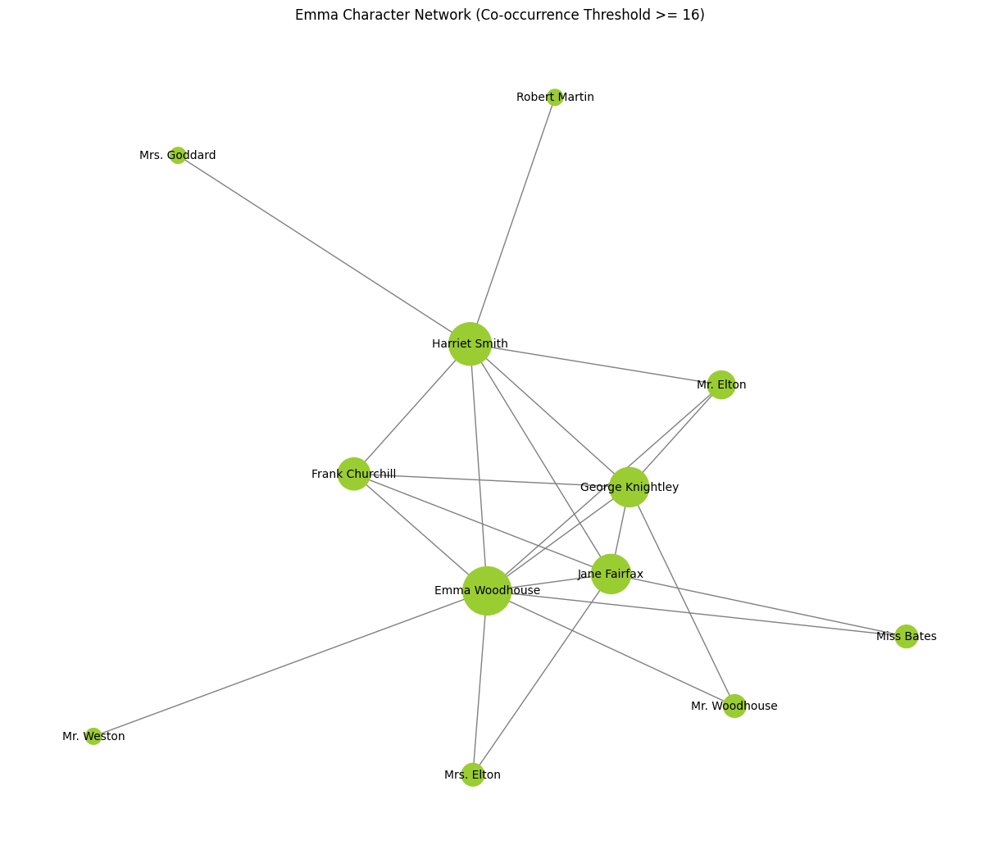

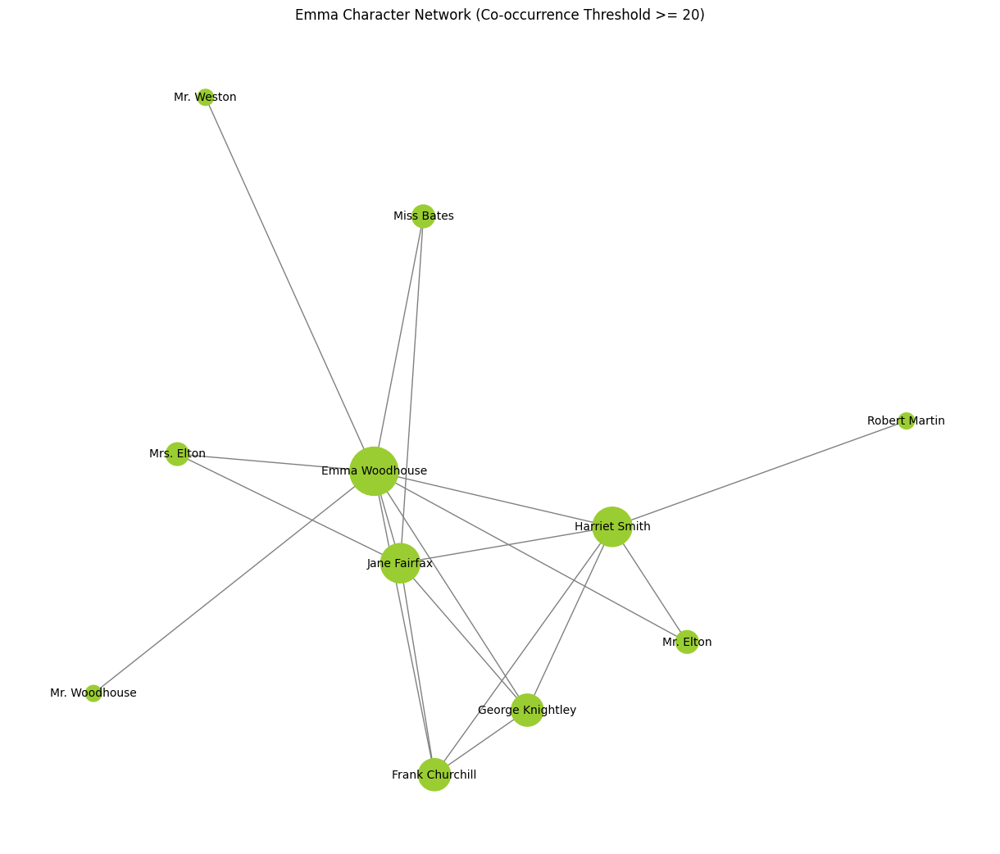

In [ ]:
#Dichotomized network - weight of ties

# The base unweighted network is created outside the loop if not filtering by weight
# However, since we are now filtering by co-occurrence count, we need to re-create
# the graph within the loop for each threshold 'i'.

for i in [4, 8, 12, 16, 20]: # Using the specified values for thresholds
    # Filter the co-occurrence DataFrame based on the current threshold 'i'
    filtered_df = character_co_occurrence_df_e[character_co_occurrence_df_e['Co-occurrence Count'] >= i]

    # Create a new graph for each threshold
    G_e_thresholded = nx.from_pandas_edgelist(filtered_df,
                                'Character 1',
                                'Character 2',
                                edge_attr='Co-occurrence Count')

    # Calculate the degree of each node in the thresholded graph
    degrees = [G_e_thresholded.degree(node) for node in G_e_thresholded.nodes()]
    # Scale node sizes based on degree for better visualization
    scaled_node_sizes = [d * 200 for d in degrees]

    plt.figure(figsize=(12, 10))
    # Generate layout for the current thresholded graph
    pos = nx.spring_layout(G_e_thresholded, k=0.5, iterations=50)

    nx.draw(G_e_thresholded, pos, with_labels=True, node_color='yellowgreen', node_size=scaled_node_sizes,
            edge_color='gray', linewidths=1, font_size=10)
    plt.title(f"Emma Character Network (Co-occurrence Threshold >= {i})")
    plt.show()

Yet again, the dichotimized network confirms that Emma is the focus of the novel, along with her suitors Frank and George. The n > 20 version of the nework for Emma contains a greater number of characters than the other novels, and the characters are more connected to each other than we have seen in the networks for the other novels. The inclusion of characters such as Miss Bates and Mr. Woodhouse in this network indicates their continued presence in Emma's world and their impact on her character throughout the novel.

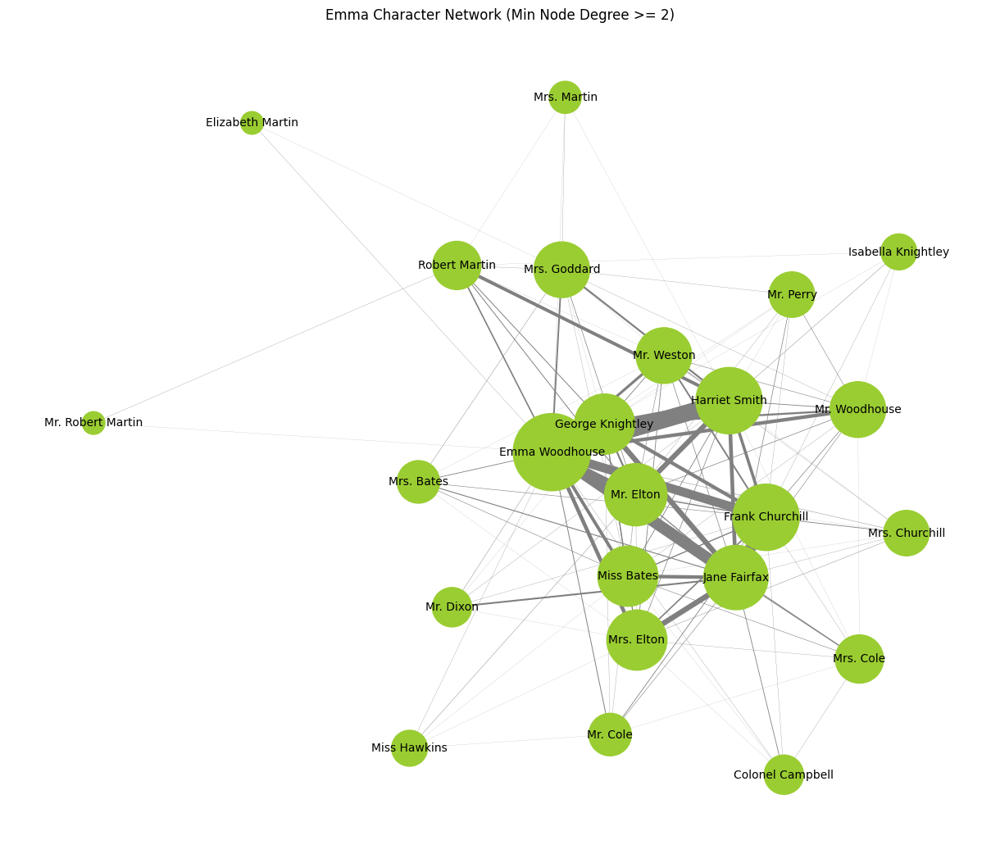

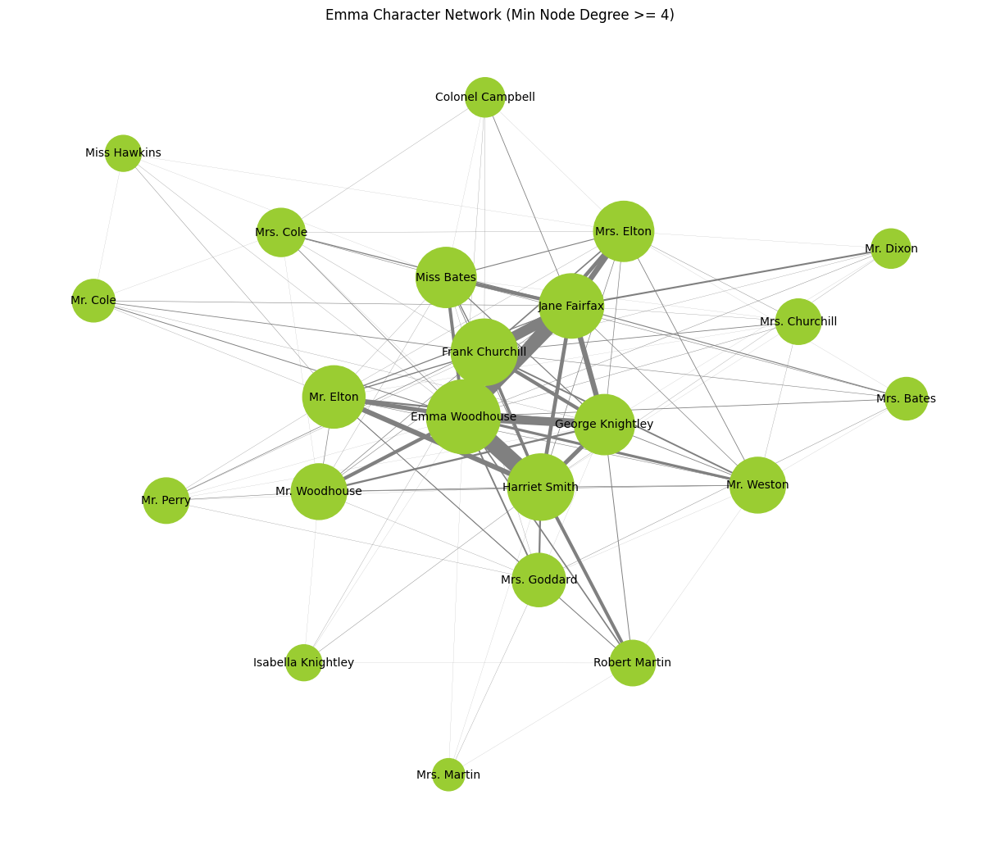

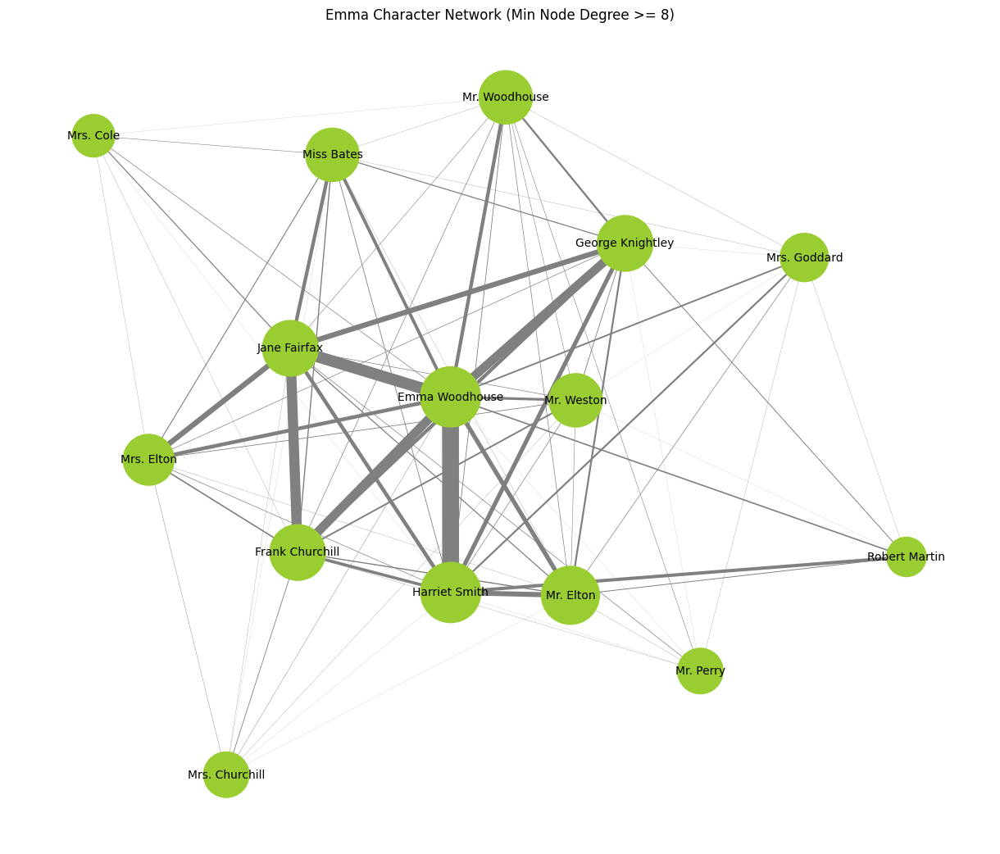

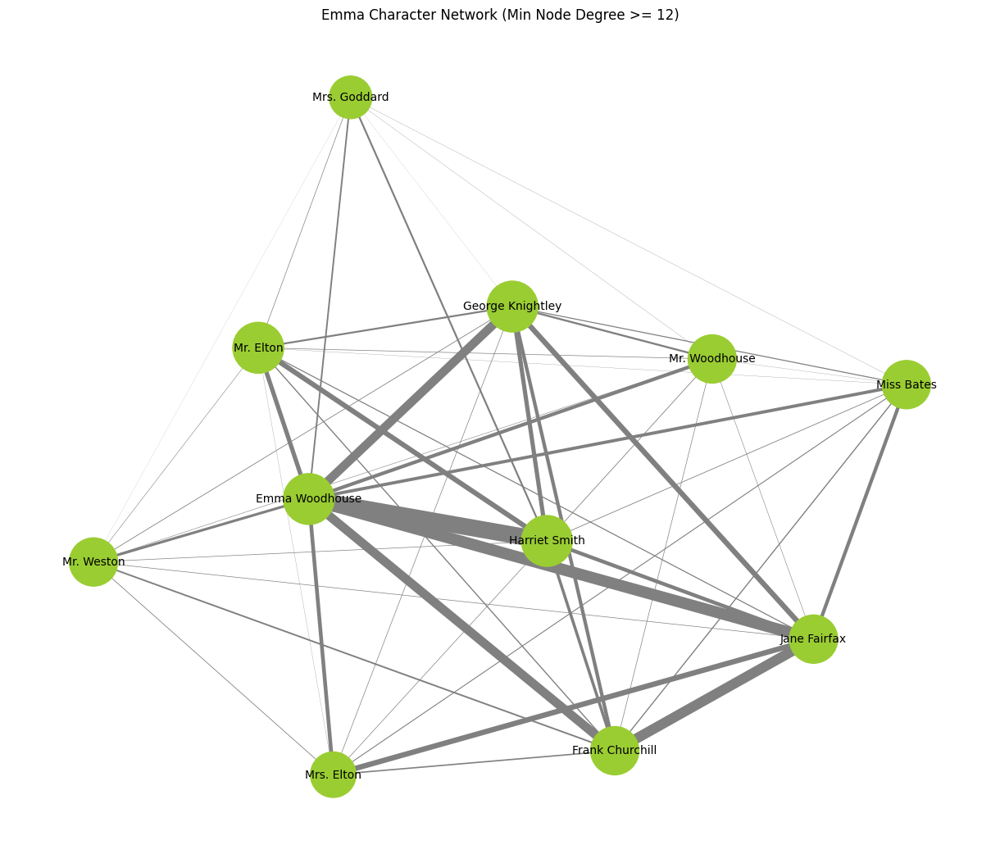

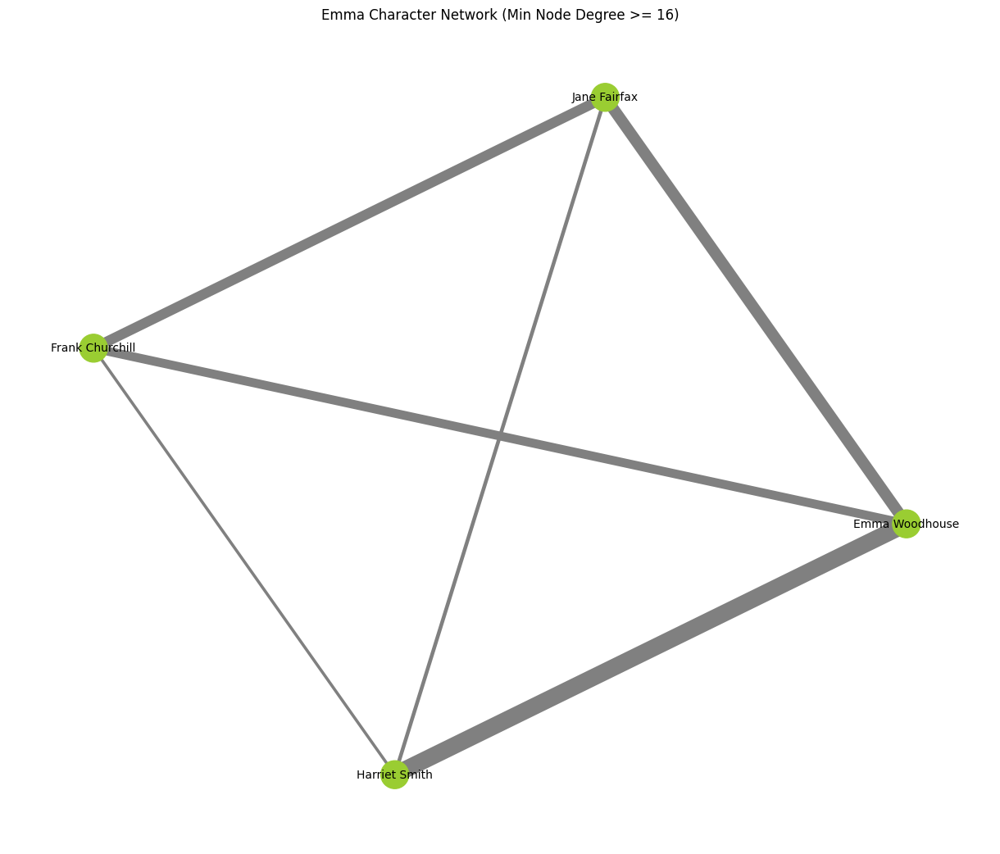

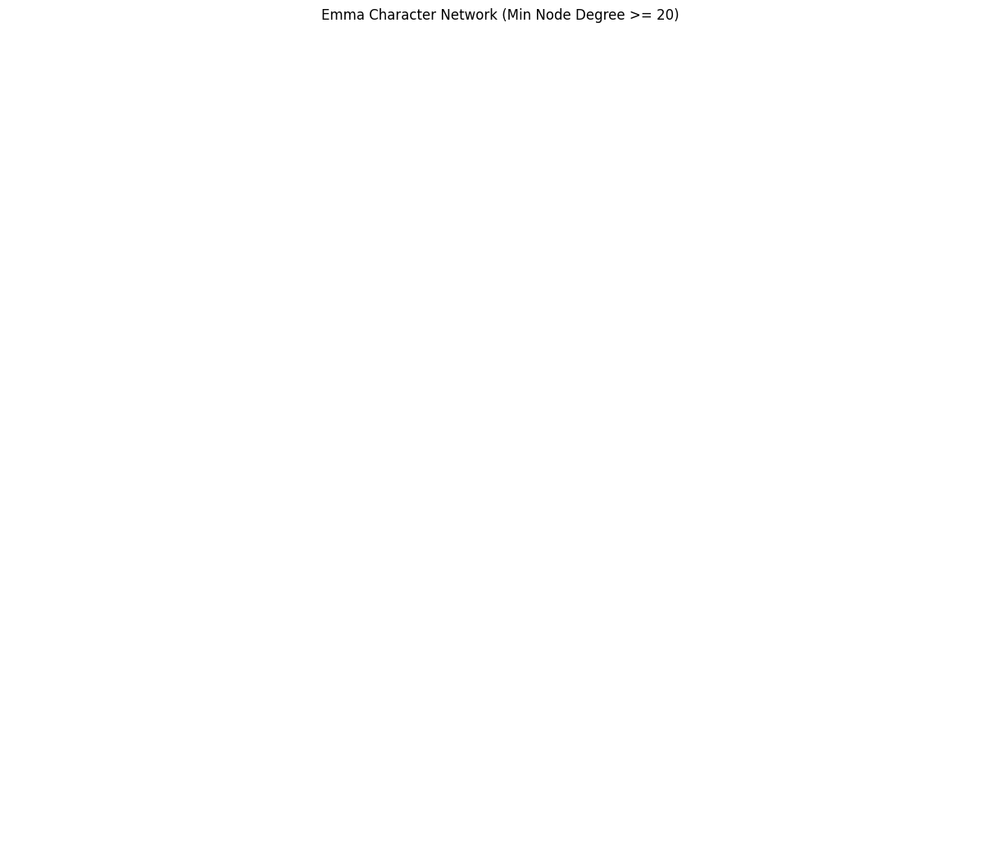

In [ ]:
#Dichotomized network - filter by node degree (number of connections)

# First, create the full graph to calculate degrees of all nodes
G_full = nx.from_pandas_edgelist(character_co_occurrence_df_e,
                            'Character 1',
                            'Character 2',
                            edge_attr='Co-occurrence Count')
degrees_full = dict(G_full.degree())

for i in [2, 4, 8, 12, 16, 20]: # Using the specified values for degree thresholds
    # Identify nodes that have a degree greater than or equal to 'i'
    nodes_above_threshold = {node for node, degree in degrees_full.items() if degree >= i}

    # Filter the co-occurrence DataFrame to keep only edges where both characters are above the degree threshold
    filtered_df = character_co_occurrence_df_e[
        (character_co_occurrence_df_e['Character 1'].isin(nodes_above_threshold)) &
        (character_co_occurrence_df_e['Character 2'].isin(nodes_above_threshold))
    ]

    # Create a new graph from the degree-filtered DataFrame
    G_e_thresholded = nx.from_pandas_edgelist(filtered_df,
                                'Character 1',
                                'Character 2',
                                edge_attr='Co-occurrence Count')

    # Calculate the degree of each node in the *newly created* thresholded graph
    # This degree will reflect connections *only within* the thresholded network.
    current_degrees = [G_e_thresholded.degree(node) for node in G_e_thresholded.nodes()]
    # Scale node sizes based on degree for better visualization
    scaled_node_sizes = [d * 200 for d in current_degrees]

    # Get the edge weights for the thresholded graph
    weights = [G_e_thresholded[u][v]['Co-occurrence Count'] for u, v in G_e_thresholded.edges()]
    scaled_weights = [w * 0.1 for w in weights] # Example scaling factor

    plt.figure(figsize=(12, 10))
    # Generate layout for the current thresholded graph
    pos = nx.spring_layout(G_e_thresholded, k=0.5, iterations=50)

    nx.draw(G_e_thresholded, pos, with_labels=True, node_color='yellowgreen', node_size=scaled_node_sizes,
            edge_color='gray', width=scaled_weights, linewidths=1, font_size=10)
    plt.title(f"Emma Character Network (Min Node Degree >= {i})")
    plt.show()

Emma also does not have an n > 20 network. The n > 16 network contains Emma, her best friend Harriet, her enemey Jane Fairfax, and her suitor Frank Churchill. It is important to note that Emma does not in fact marry Frank in the end, but Mr. Knightly, who is not represented in this network. This indicates that it is not the love story between Emma and George that is more prominent in the novel, but the machinations and interplay between Emma, Frank, and Jane that is the focus.

**Implications and Conclusions**

It is not the case that an eligible bachelor is in search of a wife. Eligible bachelors do not seem to be commanding much social capital at all. The three Jane Austen novels show that at their core, they are focused on the lives of the female main characters, and those characters' female family, friends, and acquaintances. Many of the prominent male characters are less connected than other secondary characters, especially sisters to the main character, and do not have enough interactions to be considered the focus of the novel. In these novels, the romance is secondary to the sisterhood, comraderie, and animosity in the daily lives of the female characters. These are not repressive romance novels showcasing husband hunting. They are stories that center the lives of women and their relationships with each other. That they lived happily ever after in the felicity of marriage is just icing on the cake.